In [1]:
# import library
import pandas as pd
import numpy as np
import nltk
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import umap
import gensim
import tensorflow
import keras
import ollama
import langchain
import langchain_community
import langchain_core
import bs4
import chromadb
import gradio

%matplotlib inline

print("gensim: " + gensim.__version__)
print("tensorflow: " + tensorflow.__version__)
print("keras: " + keras.__version__)

c:\Users\thoma\Data_Mining\myenv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


gensim: 4.3.3
tensorflow: 2.18.0
keras: 3.6.0


# Data Mining Lab 2
In this lab session we will focus on the use of Neural Word Embeddings and exploring some basic open source LLMs' applications to data.

## Table of Contents
1. Data preparation
2. Feature engineering
3. Model
4. Results evaluation
5. Other things you could try
6. Deep Learning
7. Word to Vector
8. Clustering
9. High-dimension Visualization
10. Large Language Models (LLMs)


### Necessary Library Requirements:

#### Same as Lab1 except PAMI:
- [Jupyter](http://jupyter.org/) (Strongly recommended but not required)
    - Install via `pip3 install jupyter` and use `jupyter notebook` in terminal to run
- [Scikit Learn](http://scikit-learn.org/stable/index.html)
    - Install via `pip3 install scikit-learn` from a terminal
- [Pandas](http://pandas.pydata.org/)
    - Install via `pip3 install pandas` from a terminal
- [Numpy](http://www.numpy.org/)
    - Install via `pip3 install numpy` from a terminal
- [Matplotlib](https://matplotlib.org/)
    - Install via `pip3 install maplotlib` from a terminal
- [Plotly](https://plot.ly/)
    - Install via `pip3 install plotly` from a terminal
- [Seaborn](https://seaborn.pydata.org/)
    - Install via `pip3 install seaborn`
- [NLTK](http://www.nltk.org/)
    - Install via `pip3 install nltk` from a terminal
- [UMAP](https://umap-learn.readthedocs.io/en/latest/)
    - Install via `pip3 install umap-learn` from a terminal
    

#### New Libraries to install:
- [Gensim](https://pypi.org/project/gensim/)
    - Install via `pip3 install gensim`

- [tensorflow](https://www.tensorflow.org/)
    - Install via `pip3 install tensorflow`
    - Also install `pip3 install tensorflow-hub`

- [Keras](https://keras.io/)
    - Install via `pip3 install keras`

- [Ollama](https://ollama.com)
    - Install via `pip3 install ollama`

- [langchain](https://www.langchain.com)
    - Install via `pip3 install langchain`
    - Also install `pip3 install langchain_community`
    - Also install `pip3 install langchain_core`
    
- [beautifulsoup4](https://pypi.org/project/beautifulsoup4/)
    - Install via `pip3 install beautifulsoup4`
    
- [chromadb](https://www.trychroma.com)
    - Install via `pip3 install chromadb`
    
- [gradio](https://www.gradio.app)
    - Install via `pip3 install gradio`
    
#### Open-source LLMs to install:
- ollama run llama3.2
- ollama run llama3.2:1b  (optional if the first one is too big)
- ollama run llava-phi3

---
## Introduction

**Dataset:** [SemEval 2017 Task](https://competitions.codalab.org/competitions/16380)

**Task:** Classify text data into 4 different emotions using word embeddings and other deep information retrieval approaches.

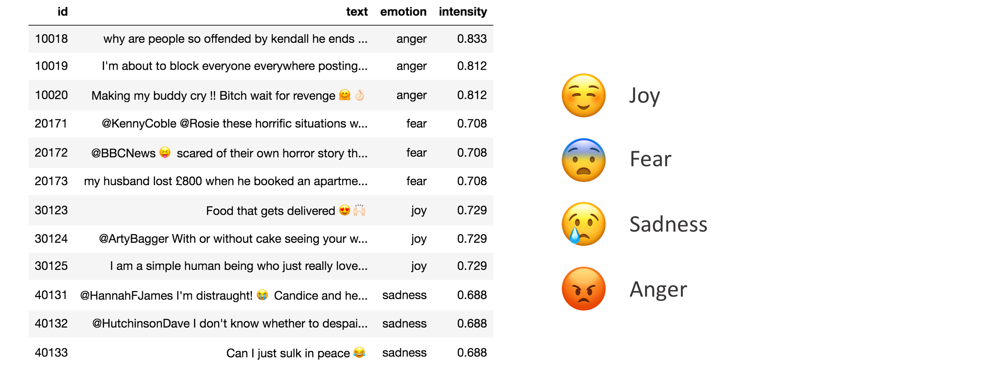

---
## 1. Data Preparation

Before beggining the lab, please make sure to download the [Google News Dataset](https://drive.google.com/file/d/0B7XkCwpI5KDYNlNUTTlSS21pQmM/edit) and place it in a folder named "GoogleNews" in the same directory as this file.

## 1.1 Load data

We start by loading the csv files into a single pandas dataframe for training and one for testing.

In [2]:
import pandas as pd

### training data
anger_train = pd.read_csv("data/semeval/train/anger-ratings-0to1.train.txt",
                         sep="\t", header=None,names=["id", "text", "emotion", "intensity"])
sadness_train = pd.read_csv("data/semeval/train/sadness-ratings-0to1.train.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
fear_train = pd.read_csv("data/semeval/train/fear-ratings-0to1.train.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
joy_train = pd.read_csv("data/semeval/train/joy-ratings-0to1.train.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])

In [3]:
# combine 4 sub-dataset
train_df = pd.concat([anger_train, fear_train, joy_train, sadness_train], ignore_index=True)

In [4]:
### testing data
anger_test = pd.read_csv("data/semeval/dev/anger-ratings-0to1.dev.gold.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
sadness_test = pd.read_csv("data/semeval/dev/sadness-ratings-0to1.dev.gold.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
fear_test = pd.read_csv("data/semeval/dev/fear-ratings-0to1.dev.gold.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])
joy_test = pd.read_csv("data/semeval/dev/joy-ratings-0to1.dev.gold.txt",
                         sep="\t", header=None, names=["id", "text", "emotion", "intensity"])

# combine 4 sub-dataset
test_df = pd.concat([anger_test, fear_test, joy_test, sadness_test], ignore_index=True)
train_df.head()

,id,text,emotion,intensity
0,10000,How the fu*k! Who the heck! moved my fridge!.....,anger,0.938
1,10001,So my Indian Uber driver just called someone t...,anger,0.896
2,10002,@DPD_UK I asked for my parcel to be delivered ...,anger,0.896
3,10003,so ef whichever butt wipe pulled the fire alar...,anger,0.896
4,10004,Don't join @BTCare they put the phone down on ...,anger,0.896


In [5]:
# shuffle dataset
train_df = train_df.sample(frac=1)
test_df = test_df.sample(frac=1)

In [6]:
print("Shape of Training df: ", train_df.shape)
print("Shape of Testing df: ", test_df.shape)

Shape of Training df:  (3613, 4)
Shape of Testing df:  (347, 4)


---
### ** >>> Exercise 1 (Take home): **  
Plot word frequency for Top 30 words in both train and test dataset. (Hint: refer to DM lab 1)


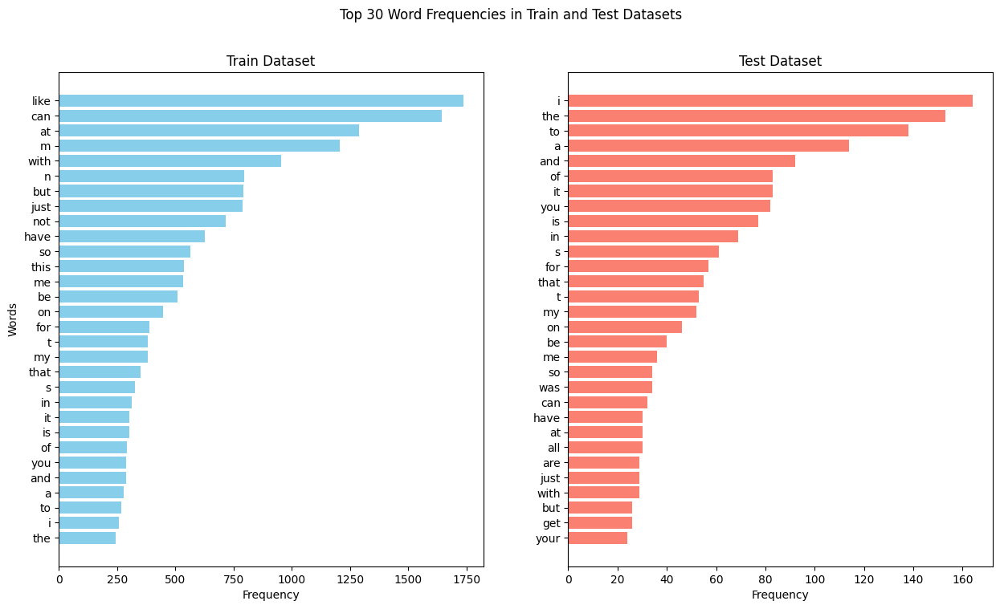

In [7]:
import matplotlib.pyplot as plt
from collections import Counter
import re

# Define a function to calculate word frequency
def word_frequency(df):
    # Convert all text to lowercase and remove non-alphabetic characters
    all_text = " ".join(df["text"]).lower()
    words = re.findall(r'\b\w+\b', all_text)  # Extract words
    word_counts = Counter(words)  # Calculate word frequency
    return word_counts

# Calculate word frequency in training and testing datasets
train_word_counts = word_frequency(train_df)
test_word_counts = word_frequency(test_df)

# Select the top 30 most common words
train_common_words = train_word_counts.most_common(30)
test_common_words = test_word_counts.most_common(30)

# Extract words and their frequencies for plotting
train_words, train_freqs = zip(*train_common_words)
test_words, test_freqs = zip(*test_common_words)

# Create the plot
fig, axs = plt.subplots(1, 2, figsize=(15, 8))
fig.suptitle("Top 30 Word Frequencies in Train and Test Datasets")

# Plot word frequency distribution for training data
axs[0].barh(train_words[::-1], train_freqs, color="skyblue")  # Reverse to display from high to low
axs[0].set_title("Train Dataset")
axs[0].invert_yaxis()  # Ensure the highest frequency word is at the top
axs[0].set_xlabel("Frequency")
axs[0].set_ylabel("Words")

# Plot word frequency distribution for test data
axs[1].barh(test_words[::-1], test_freqs[::-1], color="salmon")  # Reverse for test data as well
axs[1].set_title("Test Dataset")
axs[1].set_xlabel("Frequency")

plt.show()




---
### 1.2 Save data

We will save our data in Pickle format. The pickle module implements binary protocols for serializing and de-serializing a Python object structure.   
  
Some advantages for using pickle structure:  
* Because it stores the attribute type, it's more convenient for cross-platform use.  
* When your data is huge, it could use less space to store also consume less loading time.   

In [8]:
## save to pickle file
train_df.to_pickle("train_df.pkl") 
test_df.to_pickle("test_df.pkl")

In [9]:
import pandas as pd

## load a pickle file
train_df = pd.read_pickle("train_df.pkl")
test_df = pd.read_pickle("test_df.pkl")

For more information: https://reurl.cc/0Dzqx

---
### 1.3 Exploratory data analysis (EDA)

Again, before getting our hands dirty, we need to explore a little bit and understand the data we're dealing with.

In [10]:
# group to find distribution
train_df.groupby(['emotion']).count()['text']

emotion
anger       857
fear       1147
joy         823
sadness     786
Name: text, dtype: int64

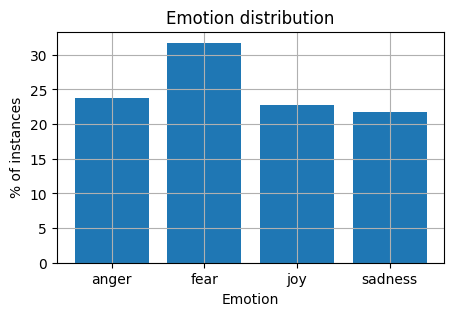

In [11]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

# the histogram of the data
labels = train_df['emotion'].unique()
post_total = len(train_df)
df1 = train_df.groupby(['emotion']).count()['text']
df1 = df1.apply(lambda x: round(x*100/post_total,3))

#plot
fig, ax = plt.subplots(figsize=(5,3))
plt.bar(df1.index,df1.values)

#arrange
plt.ylabel('% of instances')
plt.xlabel('Emotion')
plt.title('Emotion distribution')
plt.grid(True)
plt.show()

---

## 2. Feature engineering
### Using Bag of Words
Using scikit-learn ```CountVectorizer``` perform word frequency and use these as features to train a model.  
http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html

In [12]:
from sklearn.feature_extraction.text import CountVectorizer

In [13]:
# build analyzers (bag-of-words)
BOW_vectorizer = CountVectorizer() 

In [14]:
# 1. Learn a vocabulary dictionary of all tokens in the raw documents.
BOW_vectorizer.fit(train_df['text'])

# 2. Transform documents to document-term matrix.
train_data_BOW_features = BOW_vectorizer.transform(train_df['text'])
test_data_BOW_features = BOW_vectorizer.transform(test_df['text'])

In [15]:
# check the result
train_data_BOW_features

<3613x10115 sparse matrix of type '<class 'numpy.int64'>'
	with 51467 stored elements in Compressed Sparse Row format>

In [16]:
type(train_data_BOW_features)

scipy.sparse._csr.csr_matrix

In [17]:
# add .toarray() to show
train_data_BOW_features.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [18]:
# check the dimension
train_data_BOW_features.shape

(3613, 10115)

In [19]:
# observe some feature names
feature_names = BOW_vectorizer.get_feature_names_out()
feature_names[100:110]

array(['2k17', '2much', '2nd', '30', '300', '301', '30am', '30pm', '30s',
       '31'], dtype=object)

The embedding is done. We can technically feed this into our model. However, depending on the embedding technique you use and your model, your accuracy might not be as high, because:

* curse of dimensionality  (we have 10,115 dimension now)
* some important features are ignored (for example, some models using emoticons yeld better performance than counterparts)

In [20]:
"😂" in feature_names

False

Let's try using another tokenizer below.

In [21]:
import nltk

nltk.data.path = []
nltk.download('punkt', download_dir=r"C:\Users\thoma\Data_Mining\DM2024-Lab2-Master-main\DM2024-Lab2-Master-main\nltk_data")
nltk.download('punkt_tab', download_dir=r"C:\Users\thoma\Data_Mining\DM2024-Lab2-Master-main\DM2024-Lab2-Master-main\nltk_data")
nltk.data.path.append(r"C:\Users\thoma\Data_Mining\DM2024-Lab2-Master-main\DM2024-Lab2-Master-main\nltk_data")

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\thoma\Data_Mining\DM2024-Lab2-Master-
[nltk_data]     main\DM2024-Lab2-Master-main\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\thoma\Data_Mining\DM2024-Lab2-Master-
[nltk_data]     main\DM2024-Lab2-Master-main\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [22]:
import nltk

# build analyzers (bag-of-words)
BOW_500 = CountVectorizer(max_features=500, tokenizer=nltk.word_tokenize) 

# apply analyzer to training data
BOW_500.fit(train_df['text'])

train_data_BOW_features_500 = BOW_500.transform(train_df['text'])

## check dimension
train_data_BOW_features_500.shape

c:\Users\thoma\Data_Mining\myenv\lib\site-packages\sklearn\feature_extraction\text.py:521: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


(3613, 500)

In [23]:
train_data_BOW_features_500.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 3, 0, ..., 0, 0, 0],
       [0, 2, 0, ..., 0, 0, 0],
       ...,
       [3, 1, 0, ..., 0, 0, 0],
       [0, 3, 0, ..., 0, 0, 0],
       [0, 3, 0, ..., 0, 0, 0]], dtype=int64)

In [24]:
# observe some feature names
feature_names_500 = BOW_500.get_feature_names_out()
feature_names_500[100:110]

array(['change', 'cheer', 'cheerful', 'cheerfully', 'cheering', 'cheery',
       'come', 'comes', 'could', 'country'], dtype=object)

In [25]:
"😂" in feature_names_500

True

---
### ** >>> Exercise 2 (Take home): **  
Generate an embedding using the TF-IDF vectorizer instead of th BOW one with 1000 features and show the feature names for features [100:110].

In [26]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Use the TF-IDF vectorizer, limiting the number of features to 500
tfidf_vectorizer = TfidfVectorizer(max_features=500, tokenizer=nltk.word_tokenize)

# Fit and transform the training data
tfidf_features = tfidf_vectorizer.fit_transform(train_df['text'])

# Check the feature names
feature_names_tfidf = tfidf_vectorizer.get_feature_names_out()

# Display the range of feature names from index 100 to 110
print(feature_names_tfidf[100:110])


['change' 'cheer' 'cheerful' 'cheerfully' 'cheering' 'cheery' 'come'
 'comes' 'could' 'country']


---
## 3. Model
### 3.1 Decision Trees
Using scikit-learn ```DecisionTreeClassifier``` performs word frequency and uses these as features to train a model.  
http://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier

In [27]:
from sklearn.tree import DecisionTreeClassifier

# for a classificaiton problem, you need to provide both training & testing data
X_train = BOW_500.transform(train_df['text'])
y_train = train_df['emotion']

X_test = BOW_500.transform(test_df['text'])
y_test = test_df['emotion']

## take a look at data dimension is a good habit  :)
print('X_train.shape: ', X_train.shape)
print('y_train.shape: ', y_train.shape)
print('X_test.shape: ', X_test.shape)
print('y_test.shape: ', y_test.shape)

X_train.shape:  (3613, 500)
y_train.shape:  (3613,)
X_test.shape:  (347, 500)
y_test.shape:  (347,)


In [28]:
## build DecisionTree model
DT_model = DecisionTreeClassifier(random_state=1)

## training!
DT_model = DT_model.fit(X_train, y_train)

## predict!
y_train_pred = DT_model.predict(X_train)
y_test_pred = DT_model.predict(X_test)

## so we get the pred result
y_test_pred[:10]

array(['anger', 'anger', 'sadness', 'joy', 'fear', 'anger', 'fear',
       'anger', 'fear', 'anger'], dtype=object)

---
## 4. Results Evaluation

Now we will check the results of our model's performance

In [29]:
## accuracy
from sklearn.metrics import accuracy_score

acc_train = accuracy_score(y_true=y_train, y_pred=y_train_pred)
acc_test = accuracy_score(y_true=y_test, y_pred=y_test_pred)

print('training accuracy: {}'.format(round(acc_train, 2)))
print('testing accuracy: {}'.format(round(acc_test, 2)))


training accuracy: 0.99
testing accuracy: 0.68


In [30]:
## precision, recall, f1-score,
from sklearn.metrics import classification_report

print(classification_report(y_true=y_test, y_pred=y_test_pred))

              precision    recall  f1-score   support

       anger       0.66      0.68      0.67        84
        fear       0.66      0.69      0.67       110
         joy       0.72      0.71      0.71        79
     sadness       0.70      0.64      0.67        74

    accuracy                           0.68       347
   macro avg       0.68      0.68      0.68       347
weighted avg       0.68      0.68      0.68       347



In [31]:
## check by confusion matrix
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_true=y_test, y_pred=y_test_pred) 
print(cm)

[[57 18  6  3]
 [16 76  9  9]
 [ 6  9 56  8]
 [ 7 13  7 47]]


In [32]:
# Funciton for visualizing confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import itertools

def plot_confusion_matrix(cm, classes, title='Confusion matrix',
                          cmap=sns.cubehelix_palette(as_cmap=True)):
    """
    This function is modified from: 
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
    """
    classes.sort()
    tick_marks = np.arange(len(classes))    
    
    fig, ax = plt.subplots(figsize=(5,5))
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           xticklabels = classes,
           yticklabels = classes,
           title = title,
           xlabel = 'Predicted label',
           ylabel = 'True label')

    fmt = 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")
    ylim_top = len(classes) - 0.5
    plt.ylim([ylim_top, -.5])
    plt.tight_layout()
    plt.show()

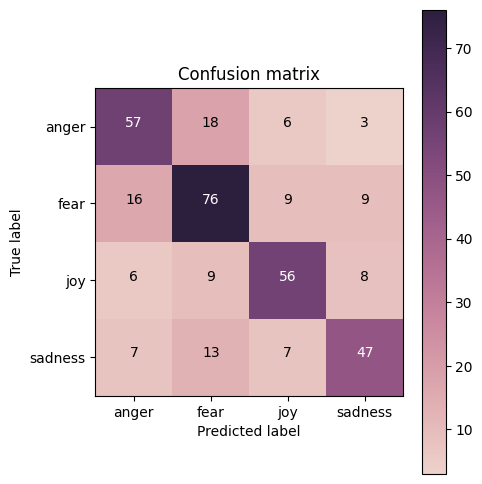

In [33]:
# plot your confusion matrix
my_tags = ['anger', 'fear', 'joy', 'sadness']
plot_confusion_matrix(cm, classes=my_tags, title='Confusion matrix')

---
### ** >>> Exercise 3 (Take home): **  
Can you interpret the results above? What do they mean?

## **1. Accuracy**

  #### **Training Accuracy: 0.99 (99%)**

  This indicates that the model performs extremely well on the training data. However, such a high value on the training set suggests the model might be overfitting, meaning it has learned the training data too well, including its noise and minor details that don't generalize to unseen data.

  #### **Testing Accuracy: 0.68 (68%)**

  This is the model's performance on the unseen test data. A testing accuracy of 68% is relatively decent but not great. The drop from 99% on training data to 68% on testing data indicates a possible overfitting issue, as the model struggles to generalize well to unseen data.
<hr>

## **2. Classification Report (Precision, Recall, F1-Score)**

#### **Precision: The proportion of positive predictions that are actually correct.**

Measures how many of the samples predicted for a class are actually correct.

For example, anger has a precision of 66%, meaning 66% of samples predicted as "anger" are truly "anger."

#### **Recall: The proportion of actual positives that are correctly identified.**

Measures how many actual samples of a class are correctly identified by the model.

For example, fear has a recall of 69%, meaning 69% of actual "fear" samples are identified correctly.

#### **F1-Score: The harmonic mean of precision and recall, providing a balance between both metrics.**

The harmonic mean of precision and recall, providing a balanced evaluation metric.

For example, joy has an F1-score of 71%, reflecting a good balance between precision and recall.

#### **Macro Average:**

The unweighted average of precision, recall, and F1-score across all classes, giving equal weight to each class, regardless of its support. Here, it is 68%.

#### **Weighted Average:**

The average of precision, recall, and F1-score weighted by the number of samples in each class, accounting for class imbalance. It is also 68%.
<hr>

## **3. Confusion Matrix**

#### **True Positives (Diagonal):**

Anger:

57 correctly predicted as anger.

Fear: 

76 correctly predicted as fear.

Joy: 

56 correctly predicted as joy.

Sadness: 

47 correctly predicted as sadness.


---
### ** >>> Exercise 4 (Take home): **  
Build a model using a ```Naive Bayes``` model and train it. What are the testing results? 

*Reference*: https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.MultinomialNB.html

In [34]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
# Build the Naive Bayes model
NB_model = MultinomialNB()

# Train the model using the BOW_500 features (you can use TF-IDF features as well)
NB_model.fit(X_train, y_train)

# Predict on the training and testing data
y_train_pred = NB_model.predict(X_train)
y_test_pred = NB_model.predict(X_test)

# Evaluate the model's performance on training and testing sets
acc_train = accuracy_score(y_true=y_train, y_pred=y_train_pred)
acc_test = accuracy_score(y_true=y_test, y_pred=y_test_pred)

print('Training accuracy: {}'.format(round(acc_train, 2)))
print('Testing accuracy: {}'.format(round(acc_test, 2)))

# Print classification report for detailed metrics (precision, recall, f1-score)
print("\nClassification Report on Test Data:\n")
print(classification_report(y_test, y_test_pred))

# Confusion Matrix
print("\nConfusion Matrix:\n")
cm = confusion_matrix(y_true=y_test, y_pred=y_test_pred)
print(cm)

Training accuracy: 0.79
Testing accuracy: 0.7

Classification Report on Test Data:

              precision    recall  f1-score   support

       anger       0.63      0.65      0.64        84
        fear       0.73      0.77      0.75       110
         joy       0.78      0.71      0.74        79
     sadness       0.64      0.62      0.63        74

    accuracy                           0.70       347
   macro avg       0.70      0.69      0.69       347
weighted avg       0.70      0.70      0.70       347


Confusion Matrix:

[[55 15  5  9]
 [ 9 85  5 11]
 [11  6 56  6]
 [12 10  6 46]]


---
### ** >>> Exercise 5 (Take home): **  

How do the results from the Naive Bayes model and the Decision Tree model compare? How do you interpret these differences? Use the theoretical background covered in class to try and explain these differences.

## **Comparison of Naive Bayes and Decision Tree Models:**
#### **1. Accuracy:**

Naive Bayes: Training accuracy = 0.79, Testing accuracy = 0.70.

Decision Tree: Training accuracy = 0.99, Testing accuracy = 0.68.

**Interpretation:**

Naive Bayes has a lower training accuracy (79%) compared to the Decision Tree (99%), but it performs better on the test data (70% vs. 68%).

Decision Trees are prone to overfitting, which is reflected in the sharp drop in performance from training (99%) to testing (68%). Overfitting occurs because Decision Trees can fit the training data too closely, capturing noise and specific patterns that don't generalize well to new, unseen data.

Naive Bayes, on the other hand, has a more consistent performance, with a relatively smaller difference between training and testing accuracy. This suggests that Naive Bayes is less likely to overfit compared to Decision Trees, especially in situations where the feature independence assumption holds (or roughly holds).

#### **2. Precision, Recall, F1-Score:**
Naive Bayes shows higher recall & precision for the "fear & joy" class than Decision Tree.

Decision Tree tends to have better F1-score for "anger & sadness" compared to Naive Bayes.

**Interpretation:**

Precision and Recall give us a more nuanced understanding of model performance.
Naive Bayes tends to perform better in terms of recall, which means it is good at identifying instances of specific classes (e.g., fear). However, it may sometimes over-predict certain classes (e.g., anger and sadness), resulting in a lower precision for those classes.

#### **3. Confusion Matrix:**
In both models, fear is generally predicted well, with Naive Bayes achieving higher recall for this class (85% vs. 76% for Decision Tree).
Decision Tree tends to misclassify anger and sadness more frequently compared to Naive Bayes.

**Interpretation:**

Naive Bayes's assumption of feature independence works well when the features are relatively independent of each other, allowing it to make more robust predictions on test data. This results in more balanced performance across different classes.

Decision Trees, which are based on recursive binary splits of the data, may struggle when the features are highly correlated. The tree might create splits that don't generalize well, resulting in poorer performance on unseen data. This is reflected in the confusion matrix, where classes like anger and sadness are often misclassified by the Decision Tree.
<hr>

#### **Model  Differences:**

Naive Bayes is a simpler model based on probabilistic assumptions, specifically the independence of features given the class. It computes the likelihood of a class given the features and assigns the class with the highest posterior probability.

Decision Tree is a non-parametric model that builds a hierarchical structure of decisions based on feature values. It splits the data recursively based on feature values, which can lead to high complexity if the tree is deep, contributing to overfitting.

**Interpretation:**

The simplicity of Naive Bayes means it is less likely to overfit compared to a Decision Tree, especially when the number of features is large or when feature independence is a reasonable assumption.

Decision Trees can capture more complex relationships between features (e.g., interactions), which is an advantage if the relationships between features are non-linear. However, this can lead to overfitting, especially if the tree is not properly pruned or if the dataset has many irrelevant or redundant features.

---

## 5. Other things you can try

Thus, there are several things you can try that will affect your results. In order to yield better results, you can experiment by: 
- Trying different features (Feature engineering)e.g Word2Vec, PCA, LDA, FastText, Clustering
- Trying different models
- Analyzing your results and interpret them to improve your feature engineering/model building process
- Iterate through the steps above until finding a satisfying result

Remember that you should also consider the task at hand and the model you'll feed the data to. 

---
## 6. Deep Learning

We use [Keras](https://keras.io/) to be our deep learning framework, and follow the [Model (functional API)](https://keras.io/models/model/) to build a Deep Neural Network (DNN) model. Keras runs with Tensorflow in the backend. It's a nice abstraction to start working with NN models. 

Because Deep Learning is a 1-semester course, we can't talk about each detail about it in the lab session. Here, we only provide a simple template about how to build & run a DL model successfully. You can follow this template to design your model.

We will begin by building a fully connected network, which looks like this:

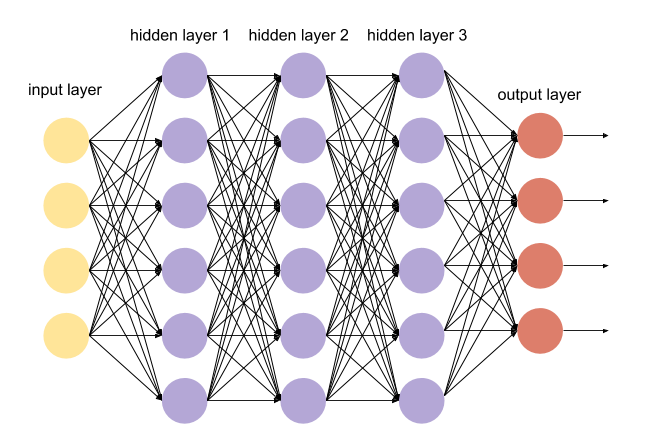

(source: https://github.com/drewnoff/spark-notebook-ml-labs/tree/master/labs/DLFramework)


### 6.1 Prepare data (X, y)

In [35]:
import keras

# standardize name (X, y) 
X_train = BOW_500.transform(train_df['text'])
y_train = train_df['emotion']

X_test = BOW_500.transform(test_df['text'])
y_test = test_df['emotion']

## check dimension is a good habbit 
print('X_train.shape: ', X_train.shape)
print('y_train.shape: ', y_train.shape)
print('X_test.shape: ', X_test.shape)
print('y_test.shape: ', y_test.shape)

X_train.shape:  (3613, 500)
y_train.shape:  (3613,)
X_test.shape:  (347, 500)
y_test.shape:  (347,)


In [36]:
import keras

In [37]:
BOW_500.transform(test_df['text'])

<347x500 sparse matrix of type '<class 'numpy.int64'>'
	with 4103 stored elements in Compressed Sparse Row format>

### 6.2 Deal with categorical label (y)

Rather than put your label `train_df['emotion']` directly into a model, we have to process these categorical (or say nominal) label by ourselves. 

Here, we use the basic method [one-hot encoding](https://en.wikipedia.org/wiki/One-hot) to transform our categorical  labels to numerical ones.


In [38]:
## deal with label (string -> one-hot)

from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
label_encoder.fit(y_train)
print('check label: ', label_encoder.classes_)
print('\n## Before convert')
print('y_train[0:4]:\n', y_train[0:4])
print('\ny_train.shape: ', y_train.shape)
print('y_test.shape: ', y_test.shape)

def label_encode(le, labels):
    enc = le.transform(labels)
    return keras.utils.to_categorical(enc)

def label_decode(le, one_hot_label):
    dec = np.argmax(one_hot_label, axis=1)
    return le.inverse_transform(dec)

y_train = label_encode(label_encoder, y_train)
y_test = label_encode(label_encoder, y_test)

print('\n\n## After convert')
print('y_train[0:4]:\n', y_train[0:4])
print('\ny_train.shape: ', y_train.shape)
print('y_test.shape: ', y_test.shape)


check label:  ['anger' 'fear' 'joy' 'sadness']

## Before convert
y_train[0:4]:
 3028    sadness
917        fear
3185    sadness
812       anger
Name: emotion, dtype: object

y_train.shape:  (3613,)
y_test.shape:  (347,)


## After convert
y_train[0:4]:
 [[0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [0. 0. 0. 1.]
 [1. 0. 0. 0.]]

y_train.shape:  (3613, 4)
y_test.shape:  (347, 4)


### 6.3 Build model

In [39]:
# I/O check
input_shape = X_train.shape[1]
print('input_shape: ', input_shape)

output_shape = len(label_encoder.classes_)
print('output_shape: ', output_shape)

input_shape:  500
output_shape:  4


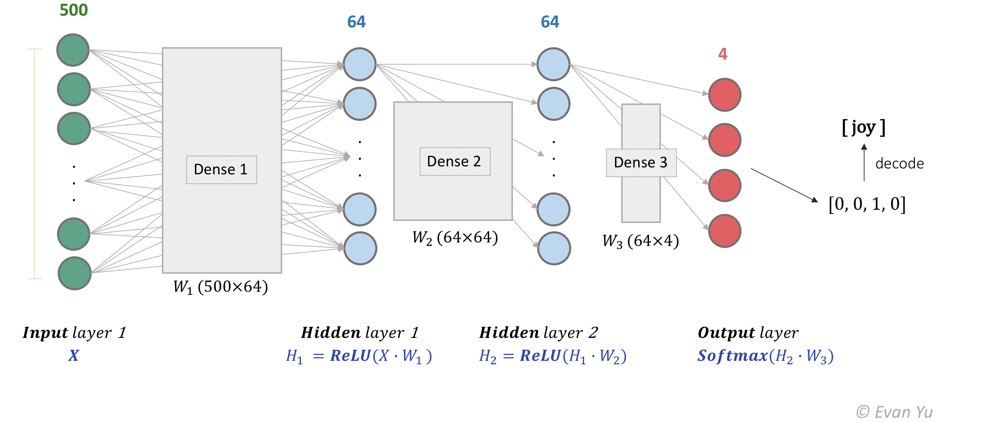

In [40]:
from keras.models import Model
from keras.layers import Input, Dense
from keras.layers import ReLU, Softmax

# input layer
model_input = Input(shape=(input_shape, ))  # 500
X = model_input

# 1st hidden layer
X_W1 = Dense(units=64)(X)  # 64
H1 = ReLU()(X_W1)

# 2nd hidden layer
H1_W2 = Dense(units=64)(H1)  # 64
H2 = ReLU()(H1_W2)

# output layer
H2_W3 = Dense(units=output_shape)(H2)  # 4
H3 = Softmax()(H2_W3)

model_output = H3

# create model
model = Model(inputs=[model_input], outputs=[model_output])

# loss function & optimizer
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# show model construction
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 500)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │        32,064 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu (ReLU)                    │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_1 (ReLU)                  │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │           260 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ softmax (Softmax)               │ (None, 4)              │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 36,484 (142.52 KB)

 Trainable params: 36,484 (142.52 KB)

 Non-trainable params: 0 (0.00 B)

### 6.4 Train

In [41]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('logs/training_log.csv')

# training setting
epochs = 25
batch_size = 32

# training!
history = model.fit(X_train, y_train, 
                    epochs=epochs, 
                    batch_size=batch_size, 
                    callbacks=[csv_logger],
                    validation_data = (X_test, y_test))
print('training finish')

Epoch 1/25


c:\Users\thoma\Data_Mining\myenv\lib\site-packages\keras\src\models\functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['keras_tensor']. Received: the structure of inputs=*
  warnings.warn(


113/113 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3236 - loss: 1.3616 - val_accuracy: 0.4063 - val_loss: 1.2762
Epoch 2/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5884 - loss: 1.1068 - val_accuracy: 0.6282 - val_loss: 0.9205
Epoch 3/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7855 - loss: 0.6284 - val_accuracy: 0.7003 - val_loss: 0.7860
Epoch 4/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8559 - loss: 0.4108 - val_accuracy: 0.7061 - val_loss: 0.7670
Epoch 5/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8881 - loss: 0.3279 - val_accuracy: 0.6859 - val_loss: 0.8362
Epoch 6/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9100 - loss: 0.2721 - val_accuracy: 0.6859 - val_loss: 0.8466
Epoch 7/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9427 - loss: 0.2014 - val_accuracy: 0.6801 - val_loss: 0.8809
Epoch 8/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9508 - loss: 0.1785 - val_accuracy: 0.6744 - val_

### 6.5 Predict on testing data

In [42]:
## predict
pred_result = model.predict(X_test, batch_size=128)
pred_result[:5]

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


array([[9.99691010e-01, 3.80961283e-05, 4.50103107e-06, 2.66385498e-04],
       [9.98776019e-01, 9.87495732e-05, 1.11710946e-07, 1.12512033e-03],
       [8.74357343e-01, 3.49838483e-05, 2.59174813e-05, 1.25581682e-01],
       [3.59597936e-04, 8.72068849e-05, 9.99502063e-01, 5.11416583e-05],
       [9.43421110e-05, 9.99902129e-01, 3.47749869e-06, 1.28025535e-09]],
      dtype=float32)

In [43]:
pred_result = label_decode(label_encoder, pred_result)
pred_result[:5]

array(['anger', 'anger', 'anger', 'joy', 'fear'], dtype=object)

In [44]:
from sklearn.metrics import accuracy_score

print('testing accuracy: {}'.format(round(accuracy_score(label_decode(label_encoder, y_test), pred_result), 2)))

testing accuracy: 0.66


In [45]:
#Let's take a look at the training log
training_log = pd.DataFrame()
training_log = pd.read_csv("logs/training_log.csv")
training_log

,epoch,accuracy,loss,val_accuracy,val_loss
0,0,0.371436,1.328664,0.406340,1.276183
1,1,0.626903,1.009732,0.628242,0.920507
2,2,0.786327,0.595436,0.700288,0.786019
3,3,0.846111,0.423335,0.706052,0.767037
4,4,0.880155,0.338978,0.685879,0.836246
5,5,0.907833,0.274726,0.685879,0.846578
6,6,0.928591,0.228555,0.680115,0.880907
7,7,0.940769,0.193236,0.674352,0.970276
8,8,0.951841,0.160570,0.671470,1.036408
9,9,0.959314,0.143711,0.671470,1.089097


---
### ** >>> Exercise 6 (Take home): **  

Plot the Training and Validation Accuracy and Loss (different plots), just like the images below.(Note: the pictures below are an example from a different model). How to interpret the graphs you got? How are they related to the concept of overfitting/underfitting covered in class?

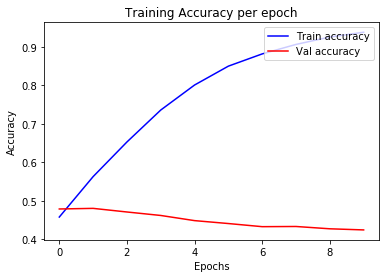


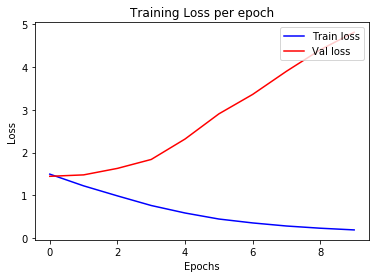

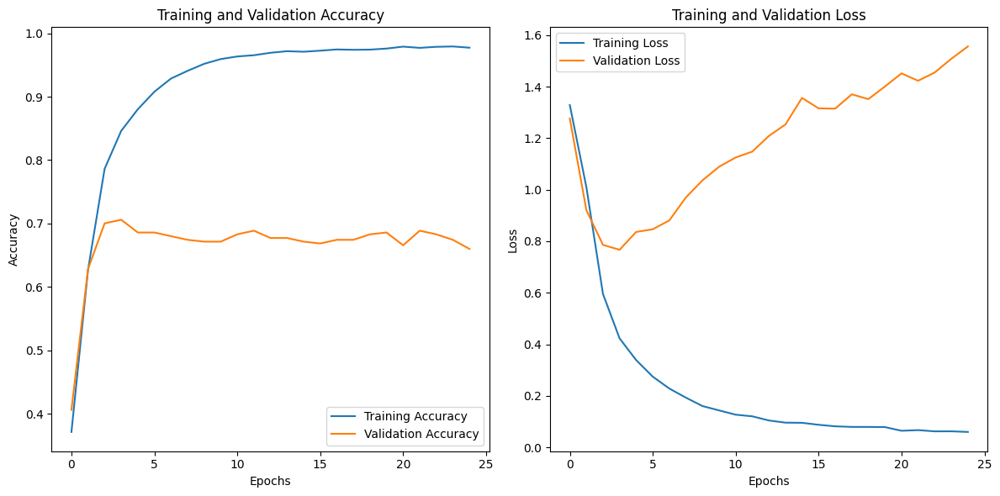

In [46]:
import matplotlib.pyplot as plt

# Extract the accuracy and loss from the training log DataFrame
train_acc = training_log['accuracy']
val_acc = training_log['val_accuracy']
train_loss = training_log['loss']
val_loss = training_log['val_loss']
epochs = training_log['epoch']

# Plot Training vs Validation Accuracy
plt.figure(figsize=(12, 6))

# Plot for Accuracy
plt.subplot(1, 2, 1)
plt.plot(epochs, train_acc, label='Training Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plot for Loss
plt.subplot(1, 2, 2)
plt.plot(epochs, train_loss, label='Training Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()



As can be seen from the figure, the accuracy of the training set increases as the number of epochs increases, and eventually approaches smoothness, but the test set begins to become unstable after the accuracy of the first few epochs increases significantly. In terms of loss, the training set also decreases the loss as the number of epochs increases, but the test set increases the loss after the initial decrease. It is speculated that this phenomenon is caused by overfitting. The main reason may be that the data set is too small.

---

### Note

If you don't have a GPU (level is higher than GTX 1060) or you are not good at setting lots of things about computer, we recommend you to use the [kaggle kernel](https://www.kaggle.com/kernels) to do deep learning model training. They have already installed all the librarys and provided free GPU for you to use.

Note however that you will only be able to run a kernel for 6 hours. After 6 hours of inactivity, your Kaggle kernel will shut down (meaning if your model takes more than 6 hours to train, you can't train it at once).


### More Information for your reference

* Keras document: https://keras.io/
* Keras GitHub example: https://github.com/keras-team/keras/tree/master/examples
* CS229: Machine Learning: http://cs229.stanford.edu/syllabus.html
* Deep Learning cheatsheet: https://stanford.edu/~shervine/teaching/cs-229/cheatsheet-deep-learning
* If you want to try TensorFlow or PyTorch: https://pytorch.org/tutorials/
https://www.tensorflow.org/tutorials/quickstart/beginner

---
## 7. Word2Vector

We will introduce how to use `gensim` to train your word2vec model and how to load a pre-trained model.

https://radimrehurek.com/gensim/index.html

### 7.1 Prepare training corpus

In [47]:
## check library
import gensim

## ignore warnings
import warnings
warnings.filterwarnings('ignore')

# # if you want to see the training messages, you can use it
# import logging
# logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

## the input type
train_df['text_tokenized'] = train_df['text'].apply(lambda x: nltk.word_tokenize(x))
train_df[['id', 'text', 'text_tokenized']].head()

,id,text,text_tokenized
3028,40201,Isn't the whole 'it's been hijacked' argument ...,"[Is, n't, the, whole, 'it, 's, been, hijacked,..."
917,20060,"@Montel_Williams If this ban goes through, it ...","[@, Montel_Williams, If, this, ban, goes, thro..."
3185,40358,#Terencecutcher #Tulsa the man onthe helicopte...,"[#, Terencecutcher, #, Tulsa, the, man, onthe,..."
812,10812,@wesrucker247 sounds like a good game plan for...,"[@, wesrucker247, sounds, like, a, good, game,..."
2929,40102,Ill say it again. If I was a Black man Id be a...,"[Ill, say, it, again, ., If, I, was, a, Black,..."


In [48]:
## create the training corpus
training_corpus = train_df['text_tokenized'].values
training_corpus[:3]

array([list(['Is', "n't", 'the', 'whole', "'it", "'s", 'been', 'hijacked', "'", 'argument', 'the', 'same', 'argument', 'used', 'to', 'ban', 'or', 'discourage', 'the', 'display', 'of', 'the', 'St', 'George', "'s", 'Cross', '?', 'Shame', '@', 'LBC']),
       list(['@', 'Montel_Williams', 'If', 'this', 'ban', 'goes', 'through', ',', 'it', 'will', 'harm', 'so', 'many', 'people', ',', 'disabled', 'veterans', ',', 'people', 'who', 'have', '#', 'chronicpain', ',', '#', 'anxiety', '#', 'iamkratom']),
       list(['#', 'Terencecutcher', '#', 'Tulsa', 'the', 'man', 'onthe', 'helicopter', 'said', 'he', 'looks', 'like', 'a', 'bad', 'dude', ',', 'that', 'is', 'the', 'problem', ',', 'when', 'they', 'see', 'black', 'they', 'see', 'bad', ','])],
      dtype=object)

### 7.2 Training our model

You can try to train your own model. More details: https://radimrehurek.com/gensim/models/word2vec.html

In [49]:
from gensim.models import Word2Vec

## setting
vector_dim = 100
window_size = 5
min_count = 1
training_epochs = 20

## model
word2vec_model = Word2Vec(sentences=training_corpus, 
                          vector_size=vector_dim, window=window_size, 
                          min_count=min_count, epochs=training_epochs)

![Imgur](https://i.imgur.com/Fca3MCs.png)

### 7.3 Generating word vector (embeddings)

In [50]:
# get the corresponding vector of a word
word_vec = word2vec_model.wv['happy']
word_vec

array([ 0.42117524,  0.42395592, -0.22786029,  0.35791802, -0.61002785,
       -1.4901081 ,  0.6876535 ,  1.2457311 , -0.53622746, -0.8364118 ,
       -0.44529366, -0.57677215, -0.13867249,  0.54552037, -0.25597253,
       -0.5200596 ,  0.18226148, -0.7735817 ,  0.58373183, -1.37229   ,
        1.109411  ,  0.48631084,  0.61484104,  0.15520391,  0.3896275 ,
       -0.05233893, -0.32675937,  0.64118737, -0.34691808,  0.55828255,
        0.11237586, -0.166578  ,  0.70114386, -0.3259029 , -0.40973294,
        0.44902387,  0.4058097 , -0.41851434, -0.8739507 , -0.46107286,
       -0.00789137, -0.1325253 ,  0.01081476, -0.01412918,  0.6466813 ,
       -0.3273343 , -0.64127207,  0.08818437,  0.15221182,  0.3346713 ,
        0.3547898 , -0.2404306 , -0.26509652, -0.01721742, -0.48677006,
       -0.66126657,  0.23297876,  0.0221006 ,  0.08855896,  0.19522813,
        0.0113123 , -0.7381907 ,  0.7294587 , -0.29162925, -0.58946395,
        0.8311301 ,  0.63047403,  0.18258935, -1.4087046 ,  0.59

In [51]:
# Get the most similar words
word = 'happy'
topn = 10
word2vec_model.wv.most_similar(word, topn=topn)

[('Makes', 0.9190337657928467),
 ('register', 0.9058213233947754),
 ('plz', 0.9010480642318726),
 ('.\\nA', 0.8973034620285034),
 ('🕋', 0.8956976532936096),
 ('Really', 0.8930900692939758),
 ('bday', 0.8900906443595886),
 ('help', 0.8872924447059631),
 ('smile', 0.8862011432647705),
 ('Be', 0.8860565423965454)]

### 7.4 Using a pre-trained w2v model

Instead of training your own model ,you can use a model that has already been trained. Here, we see 2 ways of doing that:


#### (1) Download model by yourself

source: [GoogleNews-vectors-negative300](https://code.google.com/archive/p/word2vec/)

more details: https://radimrehurek.com/gensim/models/keyedvectors.html

In [52]:
from gensim.models import KeyedVectors

## Note: this model is very huge, this will take some time ...
model_path = "GoogleNews-vectors-negative300.bin"
w2v_google_model = KeyedVectors.load_word2vec_format(model_path, binary=True)
print('load ok')

w2v_google_model.most_similar('happy', topn=10)

load ok


[('glad', 0.7408890724182129),
 ('pleased', 0.6632170677185059),
 ('ecstatic', 0.6626912355422974),
 ('overjoyed', 0.6599286794662476),
 ('thrilled', 0.6514049172401428),
 ('satisfied', 0.6437949538230896),
 ('proud', 0.636042058467865),
 ('delighted', 0.627237856388092),
 ('disappointed', 0.6269949674606323),
 ('excited', 0.6247665286064148)]

#### (2) Using gensim api

Other pretrained models are available here: https://github.com/RaRe-Technologies/gensim-data

In [53]:
import gensim.downloader as api

## If you see `SSL: CERTIFICATE_VERIFY_FAILED` error, use this:
import ssl
import urllib.request
ssl._create_default_https_context = ssl._create_unverified_context

glove_twitter_25_model = api.load("glove-twitter-25")
print('load ok')

glove_twitter_25_model.most_similar('happy', topn=10)

load ok


[('birthday', 0.9577818512916565),
 ('thank', 0.937666654586792),
 ('welcome', 0.93361496925354),
 ('love', 0.9176183342933655),
 ('miss', 0.9164500832557678),
 ('hello', 0.9158351421356201),
 ('thanks', 0.915008544921875),
 ('merry', 0.9053249359130859),
 ('bless', 0.902732253074646),
 ('wish', 0.9013164043426514)]

### 7.5 king + woman - man = ?

Let's run one of the most famous examples for Word2Vec and compute the similarity between these 3 words:

In [54]:
w2v_google_model.most_similar(positive=['king', 'woman'], negative=['man'])

[('queen', 0.7118193507194519),
 ('monarch', 0.6189674139022827),
 ('princess', 0.5902431011199951),
 ('crown_prince', 0.5499460697174072),
 ('prince', 0.5377321839332581),
 ('kings', 0.5236844420433044),
 ('Queen_Consort', 0.5235945582389832),
 ('queens', 0.5181134343147278),
 ('sultan', 0.5098593831062317),
 ('monarchy', 0.5087411999702454)]

---
### ** >>> Exercise 7 (Take home): **  

Now, we have the word vectors, but our input data is a sequence of words (or say sentence). 
How can we utilize these "word" vectors to represent the sentence data and train our model?


When we have word vectors but need to process a sentence composed of words, we need to convert the word vector into a sentence vector so that the sentence can be used as input to the model for training. Here are a few common ways to deal with it:

#### **1. Weighted Average of Word Vectors:**
For each word, different weights can be given based on its importance in the sentence. A common weighting method is TF-IDF, which determines the importance of words based on their frequency of occurrence in the corpus. In this way, we can weight the word vectors of each word and then take the weighted average to represent the entire sentence.

#### **2. Use Recurrent Neural Networks (RNN) to represent sentences:**
Recurrent neural networks (RNN), such as LSTM or GRU, are an efficient way to process sequence data. In this method, we input the word vector of each word into the RNN model in turn. The RNN processes it based on the contextual information in the sequence and outputs a hidden state to represent the semantics of the entire sentence.

#### **3. Use pre-trained language models (such as BERT):**
Models such as BERT are able to handle bidirectional information of context, so they are better able to capture the deep semantic structure in language. Using these models, we can pass the entire sentence into the BERT model and extract the hidden state of its last layer as a vector representation of the sentence. This method can obtain very rich semantic information and achieve excellent results in many natural language processing tasks.
<hr>

## 8. Clustering: k-means

Here we introduce how to use `sklearn` to do the basic **unsupervised learning** approach, k-means.    

more details: http://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html


#### Basic concept

![Image](https://i.imgur.com/PEdUf54.png)

(img source: https://towardsdatascience.com/k-means-clustering-identifying-f-r-i-e-n-d-s-in-the-world-of-strangers-695537505d)

In [55]:
# clustering target
target_list = ['happy', 'fear', 'angry', 'car', 'teacher', 'computer']
print('target words: ', target_list)

# convert to word vector
X = [word2vec_model.wv[word] for word in target_list]

target words:  ['happy', 'fear', 'angry', 'car', 'teacher', 'computer']


In [56]:
from sklearn.cluster import KMeans

# we have to decide how many cluster (k) we want
k = 2

# k-means model
kmeans_model = KMeans(n_clusters=k)
kmeans_model.fit(X)

# cluster result
cluster_result = kmeans_model.labels_

# show
for i in range(len(target_list)):
    print('word: {} \t cluster: {}'.format(target_list[i], cluster_result[i]))

  File "c:\Users\thoma\Data_Mining\myenv\lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
  File "C:\Users\thoma\AppData\Local\Programs\Python\Python39\lib\subprocess.py", line 505, in run
    with Popen(*popenargs, **kwargs) as process:
  File "C:\Users\thoma\AppData\Local\Programs\Python\Python39\lib\subprocess.py", line 951, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\thoma\AppData\Local\Programs\Python\Python39\lib\subprocess.py", line 1420, in _execute_child
    hp, ht, pid, tid = _winapi.CreateProcess(executable, args,


word: happy 	 cluster: 1
word: fear 	 cluster: 1
word: angry 	 cluster: 1
word: car 	 cluster: 0
word: teacher 	 cluster: 0
word: computer 	 cluster: 0


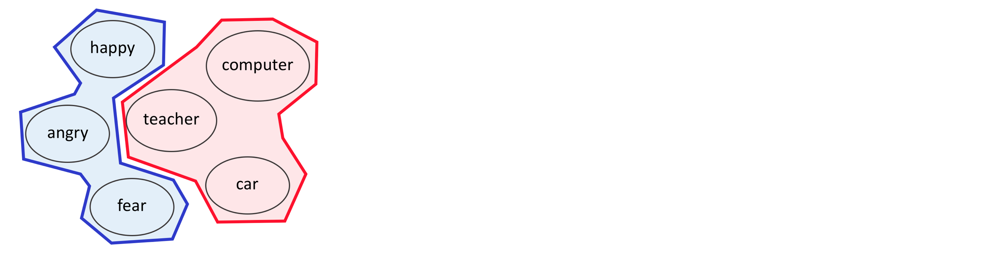

In [57]:
#check cluster membership
word = 'student'
word_vec = word2vec_model.wv[word]
kmeans_model.predict([word_vec])

array([0])

In [58]:
#check cluster membership
word = 'sad'
word_vec = word2vec_model.wv[word]
kmeans_model.predict([word_vec])

array([1])


## 9. High-dimension Visualization: t-SNE and UMAP

No matter if you use the Bag-of-words, TF-IDF, or Word2Vec, it's very hard to see the embedding result, because the dimension is larger than 3.  

In Lab 1, we already talked about PCA, t-SNE and UMAP. We can use PCA to reduce the dimension of our data, then visualize it. However, if you dig deeper into the result, you'd find it is insufficient.

Our aim will be to create a visualization similar to the one below with t-SNE:

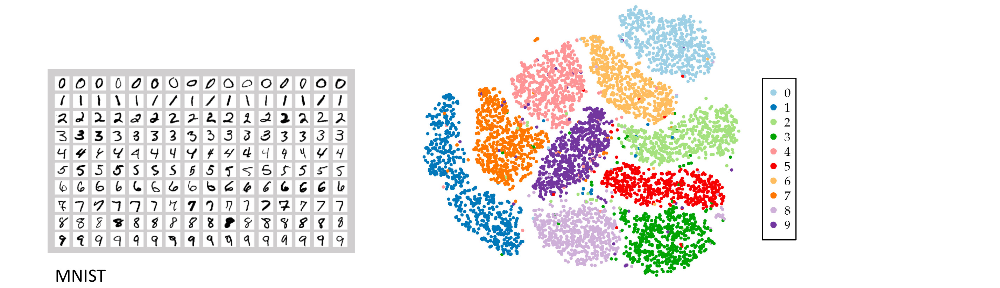

source: https://www.fabian-keller.de/research/high-dimensional-data-visualization 

And also like this for UMAP:
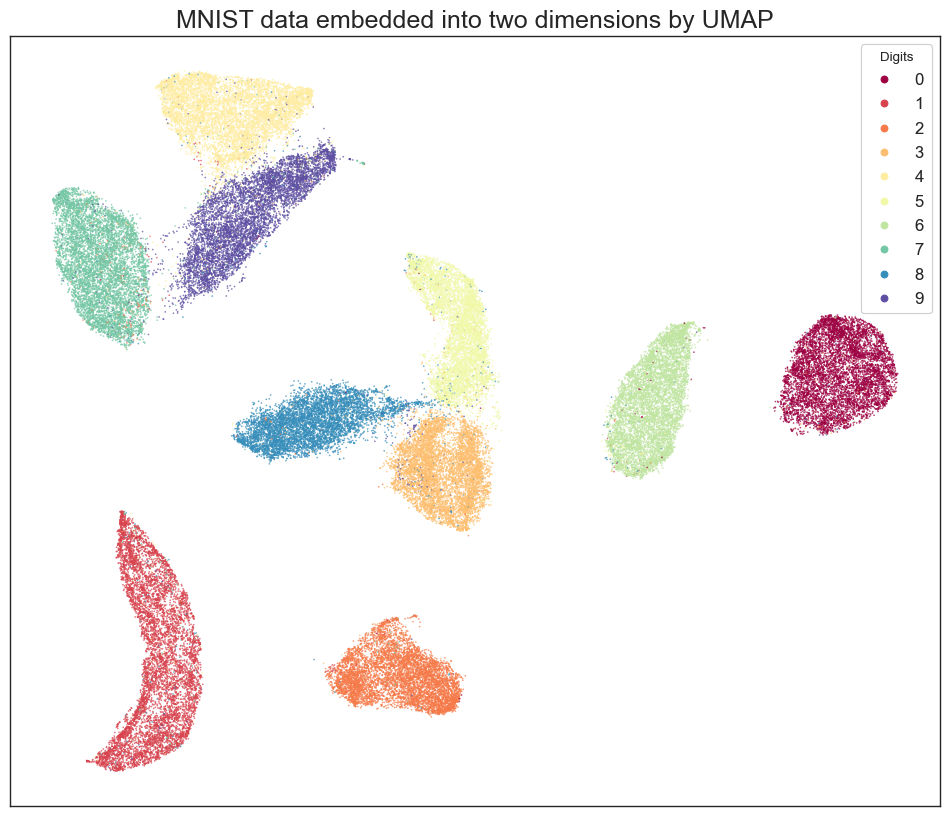

source: https://umap-learn.readthedocs.io/en/latest/auto_examples/plot_mnist_example.html

t-SNE and UMAP reference:  
http://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html 
https://umap-learn.readthedocs.io/en/latest/

### 9.1 Prepare visualizing target

Let's prepare data lists like:
- happy words
- angry words
- data words
- mining words

In [59]:
word_list = ['happy', 'angry', 'data', 'mining']

topn = 5
happy_words = ['happy'] + [word_ for word_, sim_ in w2v_google_model.most_similar('happy', topn=topn)]
angry_words = ['angry'] + [word_ for word_, sim_ in w2v_google_model.most_similar('angry', topn=topn)]        
data_words = ['data'] + [word_ for word_, sim_ in w2v_google_model.most_similar('data', topn=topn)]        
mining_words = ['mining'] + [word_ for word_, sim_ in w2v_google_model.most_similar('mining', topn=topn)]        

print('happy_words: ', happy_words)
print('angry_words: ', angry_words)
print('data_words: ', data_words)
print('mining_words: ', mining_words)

target_words = happy_words + angry_words + data_words + mining_words
print('\ntarget words: ')
print(target_words)

print('\ncolor list:')
cn = topn + 1
color = ['b'] * cn + ['g'] * cn + ['r'] * cn + ['y'] * cn
print(color)

happy_words:  ['happy', 'glad', 'pleased', 'ecstatic', 'overjoyed', 'thrilled']
angry_words:  ['angry', 'irate', 'enraged', 'indignant', 'incensed', 'annoyed']
data_words:  ['data', 'Data', 'datasets', 'dataset', 'databases', 'statistics']
mining_words:  ['mining', 'Mining', 'mines', 'coal_mining', 'mine', 'miner']

target words: 
['happy', 'glad', 'pleased', 'ecstatic', 'overjoyed', 'thrilled', 'angry', 'irate', 'enraged', 'indignant', 'incensed', 'annoyed', 'data', 'Data', 'datasets', 'dataset', 'databases', 'statistics', 'mining', 'Mining', 'mines', 'coal_mining', 'mine', 'miner']

color list:
['b', 'b', 'b', 'b', 'b', 'b', 'g', 'g', 'g', 'g', 'g', 'g', 'r', 'r', 'r', 'r', 'r', 'r', 'y', 'y', 'y', 'y', 'y', 'y']


### 9.2 Plot using t-SNE and UMAP (2-dimension)

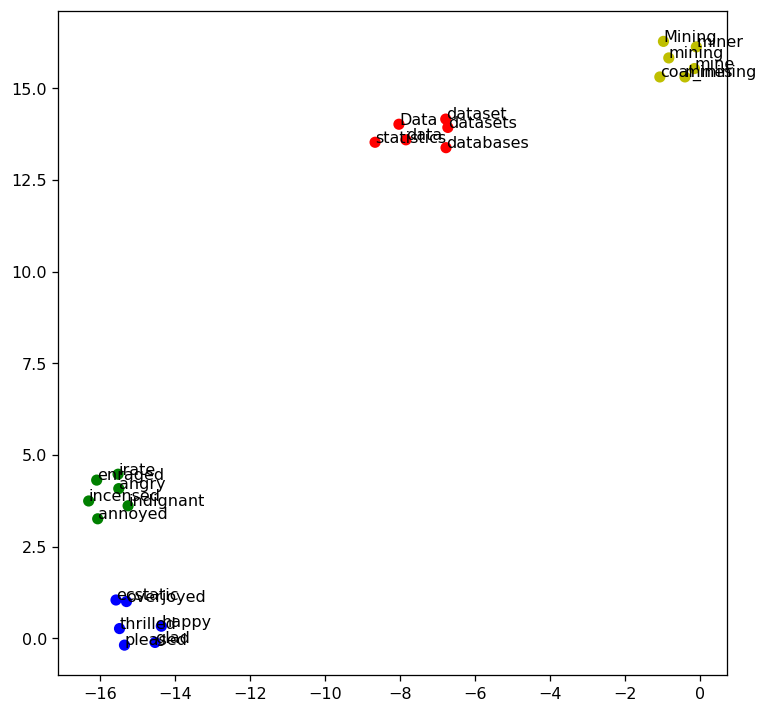

In [60]:
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

## w2v model
model = w2v_google_model

## prepare training word vectors
size = 200
target_size = len(target_words)
all_word = list(model.index_to_key)
word_train = target_words + all_word[:size]
X_train = model[word_train]

## t-SNE model
tsne = TSNE(n_components=2, metric='cosine', random_state=28)

## training
X_tsne = tsne.fit_transform(X_train)

## plot the result
plt.figure(figsize=(7.5, 7.5), dpi=115)
plt.scatter(X_tsne[:target_size, 0], X_tsne[:target_size, 1], c=color)
for label, x, y in zip(target_words, X_tsne[:target_size, 0], X_tsne[:target_size, 1]):
    plt.annotate(label, xy=(x,y), xytext=(0,0),  textcoords='offset points')
plt.show()

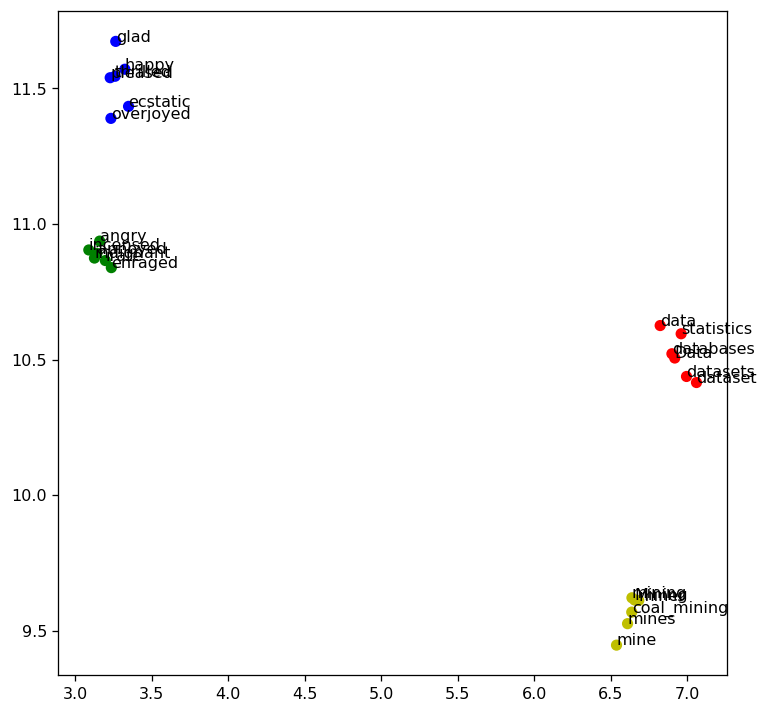

In [61]:
import matplotlib.pyplot as plt
import umap.umap_ as umap

## w2v model
model = w2v_google_model

## prepare training word vectors
size = 200
target_size = len(target_words)
all_word = list(model.index_to_key)
word_train = target_words + all_word[:size]
X_train = model[word_train]

## UMAP model
umap_model = umap.UMAP(n_components=2, metric='cosine', random_state=28)

## training
X_umap = umap_model.fit_transform(X_train)

## plot the result
plt.figure(figsize=(7.5, 7.5), dpi=115)
plt.scatter(X_umap[:target_size, 0], X_umap[:target_size, 1], c=color)
for label, x, y in zip(target_words, X_umap[:target_size, 0], X_umap[:target_size, 1]):
    plt.annotate(label, xy=(x,y), xytext=(0,0),  textcoords='offset points')
plt.show()



### ** >>> Exercise 8 (Take home): **  

Generate a t-SNE and UMAP visualization to show the 15 words most related to the words "angry", "happy", "sad", "fear" (60 words total). Compare the differences between both graphs.

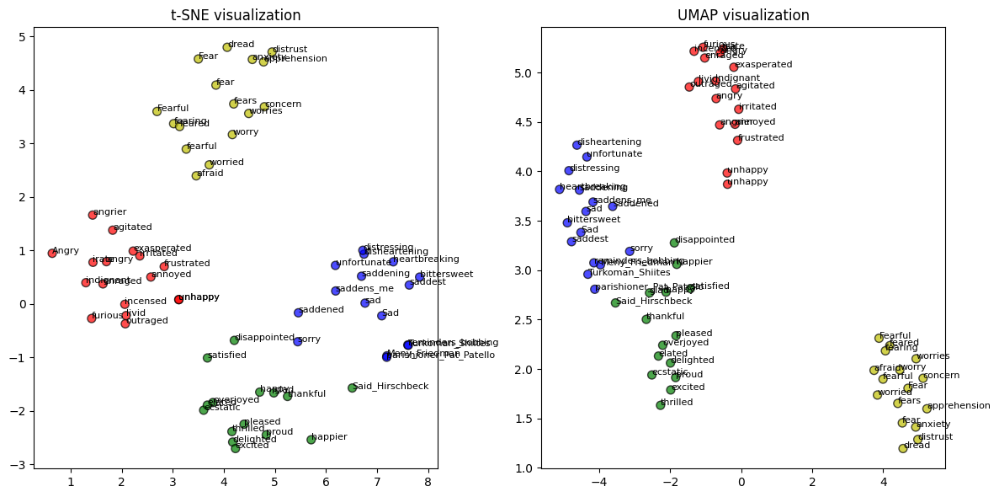

In [62]:
import matplotlib.pyplot as plt
import gensim.downloader as api
from sklearn.manifold import TSNE
import umap
import numpy as np

# Load the pre-trained word2vec model
model = w2v_google_model

# Target words
target_words = ['angry', 'happy', 'sad', 'fear']

# Retrieve 15 most similar words for each target word
topn = 15
similar_words = {}
for word in target_words:
    similar_words[word] = [word] + [sim_word for sim_word, _ in model.most_similar(word, topn=topn)]

# Prepare the list of words to visualize
all_words = [word for sublist in similar_words.values() for word in sublist]

# Check if the words exist in the model's vocabulary
all_words = [word for word in all_words if word in model.key_to_index]

# Extract word vectors for the target words and their most similar words
word_vectors = np.array([model[word] for word in all_words])

# t-SNE
tsne = TSNE(n_components=2, metric='cosine', random_state=28)
X_tsne = tsne.fit_transform(word_vectors)

# UMAP
umap_model = umap.UMAP(n_components=2, metric='cosine', random_state=28)
X_umap = umap_model.fit_transform(word_vectors)

# Assign colors based on the target word groupings
color_map = {'angry': 'r', 'happy': 'g', 'sad': 'b', 'fear': 'y'}
colors = []
for word in all_words:
    # Use the color of the main word for the cluster
    for target in target_words:
        if word == target or word in similar_words[target]:
            colors.append(color_map[target])
            break

# Plot t-SNE results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=colors, s=50, edgecolors='k', alpha=0.7)
for i, word in enumerate(all_words):
    plt.annotate(word, (X_tsne[i, 0], X_tsne[i, 1]), fontsize=8)
plt.title('t-SNE visualization')

# Plot UMAP results
plt.subplot(1, 2, 2)
plt.scatter(X_umap[:, 0], X_umap[:, 1], c=colors, s=50, edgecolors='k', alpha=0.7)
for i, word in enumerate(all_words):
    plt.annotate(word, (X_umap[i, 0], X_umap[i, 1]), fontsize=8)
plt.title('UMAP visualization')

plt.tight_layout()
plt.show()




It can be seen from the figure that the classification effect of UMAP is better.
<hr>

## 10. Large Language Models (LLMs)
Large Language Models (LLMs) are AI models trained on vast text data to understand and generate human language. Models like GPT and BERT excel at tasks like translation, summarization, and sentiment analysis due to their deep learning techniques and large-scale training. Recently these models got popular with the rise of Open-AI's ChatGPT and their different models, showcasing the potential of these models in a lot of aspects of our current society.

Open-source LLMs are cost-effective and customizable, with strong community support, but may underperform compared to paid models and require technical expertise to manage. Paid LLMs offer superior performance, ease of use, and regular updates, but are costly, less flexible, and create dependency on external providers for ongoing access and updates.

#### Open Source LLMs: 
In this lab we are going to use Ollama ([Ollama GitHub Link](https://github.com/ollama/ollama)), that is a library that let us use a long list of open-source LLMs of differing size. For this section we are going to be using **'llama3.2'** or **'llama3.2:1b'** for **text based tasks**, and **'llava-phi3'** for **multi-modal tasks** (e.g. image to text). Ollama has a great variety of models, and those can be found here: [model library](https://ollama.com/library). You are free to explore them if you want to try using them, you can check the advantages and disadvantages of each.

Or they can also be observed in here:
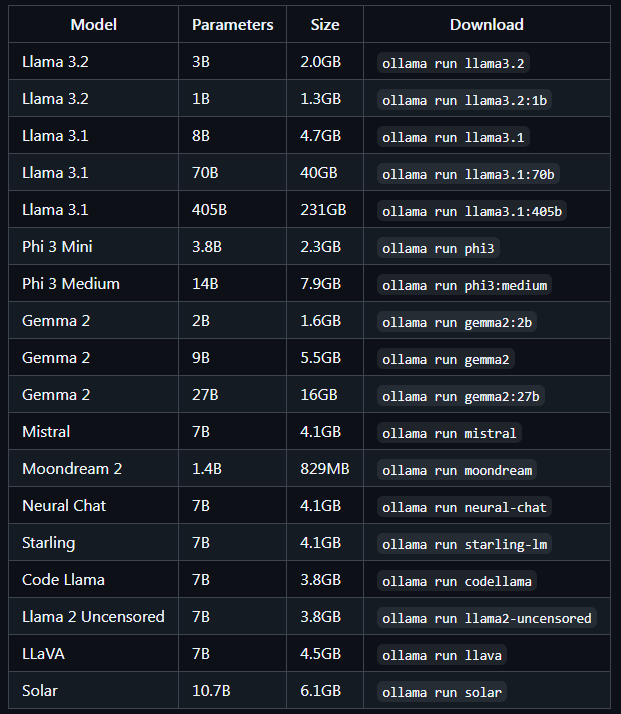

In the previous image we can observe that all LLMs have something called parameters, these are the internal weights that the model learns during training, helping it understand and generate language. The more a model has, the more complex and accurate it can be, but it also needs more memory to run.

For example:

Models with **7 billion parameters** need at least **8 GB of VRAM**.
**13 billion parameters** require **16 GB of VRAM**.
**33 billion parameters** need **32 GB of VRAM**.
The higher the number of parameters, the more memory and computational power the model needs to function efficiently.

And so that is why we are trying to use small LLMs for this practice, because they require a lot of computational resources, so by using 'llama3.2' and 'llava-phi3', both models with 3 billion parameters, we will only use at most 8 GB of VRAM. But if there are some issues with 'llama3.2' we can still use 'llama3.2:1b' the model with 1 billion parameters that requires less resources.

So now let's talk about the models: 
**LLaMA 3.2** is part of the LLaMA series (Large Language Model Meta AI), designed to provide efficient language understanding and generation. Despite having fewer parameters than some larger models, it offers strong performance in NLP tasks, making it suitable for scenarios where both accuracy and resource efficiency are important.

**LLaVA** (Large Language and Vision Assistant) models, like **LLaVA-Phi3** are multimodal models combining language and vision capabilities. It can interpret visual inputs like images and generate corresponding text, making it ideal for tasks that require both visual understanding and language generation, such as image captioning and answering visual-based questions.

**I will be using the llama3.2 model going onwards, you can change it for the smallest version if it is necessary for you, or you can try to run it on Kaggle where you can use online GPU resources for it.**

### 10.1 Text Prompting
Like with ChatGPT we can use these models to ask about anything. Here we are going to ask a question and then ask it to return it in markdown format to make it look better afterwards.

In [63]:
import ollama
response = ollama.chat(model='llama3.2', messages=[
    {
        'role': 'user',
        'content': 'What is data mining? (in markdown format)'
    },
])

print(response['message']['content'])

**Data Mining**

### Definition

Data mining is the process of automatically discovering patterns, relationships, and insights from large datasets using various statistical and mathematical techniques.

### Goals

* Identify hidden patterns or relationships in data
* Extract relevant information from data
* Support business decision-making with informed insights

### Types of Data Mining

#### 1. **Supervised Learning**

* Used when the target variable is already known (e.g., classification, regression)
* Goal: Predict continuous outcomes or categorize instances into classes

#### 2. **Unsupervised Learning**

* Used when the target variable is unknown (e.g., clustering, dimensionality reduction)
* Goal: Identify patterns, group similar data points together, and reduce feature dimensions

#### 3. **Semi-Supervised Learning**

* Combination of supervised and unsupervised learning
* Used when some labeled examples are available but not enough for a complete classification model

### Data

**We can use the IPython library to make the response look better:**

In [64]:
from IPython.display import display, Markdown, Latex
display(Markdown('*some markdown* $\phi$'))

*some markdown* $\phi$

In [65]:
display(Markdown(response['message']['content']))

**Data Mining**
================

### Definition

Data mining is the process of automatically discovering patterns, relationships, and insights from large datasets using various statistical and mathematical techniques.

### Goals

* Identify hidden patterns or relationships in data
* Extract relevant information from data
* Support business decision-making with informed insights

### Types of Data Mining

#### 1. **Supervised Learning**

* Used when the target variable is already known (e.g., classification, regression)
* Goal: Predict continuous outcomes or categorize instances into classes

#### 2. **Unsupervised Learning**

* Used when the target variable is unknown (e.g., clustering, dimensionality reduction)
* Goal: Identify patterns, group similar data points together, and reduce feature dimensions

#### 3. **Semi-Supervised Learning**

* Combination of supervised and unsupervised learning
* Used when some labeled examples are available but not enough for a complete classification model

### Data Mining Techniques

1. **Association Rule Mining**: Identifies associations between items in large datasets (e.g., customer purchases)
2. **Clustering**: Groups similar data points together based on their characteristics
3. **Dimensionality Reduction**: Reduces the number of features in a dataset while preserving important information
4. **Decision Trees**: Builds tree-like models to classify data or make predictions

### Applications of Data Mining

1. **Marketing Analytics**
2. **Fraud Detection**
3. **Customer Segmentation**
4. **Predictive Maintenance**

### Benefits

* Improved decision-making with informed insights
* Increased efficiency and productivity through automation
* Enhanced customer satisfaction and loyalty


### ** >>> Exercise 9 (Take home): **  

You noticed there is a **role** parameter inside the ollama.chat function, investigate what other roles there can be inside the function and what do they do. Give an example of a prompt using another role in additional to the **user** one.

In [66]:
from IPython.display import display, Markdown

response = ollama.chat(
    model='llama3.2',
    messages=[
        {"role": "system", "content": "You are an assistant who helps with financial analysis."},
        {"role": "user", "content": "What are the latest trends in ESG investing?"},
        {"role": "assistant", "content": "ESG investing focuses on environmental, social, and governance factors. The latest trends include increasing emphasis on sustainable investments and corporate responsibility."}
    ]
)

display(Markdown(response['message']['content']))


 Some notable trends include:

1. **Integration of ESG metrics into mainstream finance**: ESG considerations are now being incorporated into traditional investment analysis to assess risk and return.
2. **Responsible Investment (RI) and Sustainability Investing (SI)**: Investors are seeking to align their portfolios with long-term sustainability goals while managing risks.
3. **Stewardship investing**: This trend focuses on active ownership, engagement, and advocacy among investors to promote ESG best practices and improve company performance.
4. **Thematic investing**: Investments are being made in industries that address pressing global issues, such as climate change, clean energy, and healthcare.
5. **Impact investing**: Investors seek to generate both financial returns and positive social or environmental impact from their investments.
6. **ESG incorporation into fixed income markets**: ESG considerations are becoming increasingly important for bond investors, with many seeking more sustainable investment options.
7. **Increased focus on climate risk**: Climate change is a major concern in the investment community, with many considering it an essential aspect of ESG analysis.
8. **Growing demand for ESG reporting and transparency**: Investors expect companies to provide clear and reliable information about their ESG performance, which is driving the development of standardized reporting frameworks like CDP and GRI.
9. **Integration of technology and data analytics in ESG investing**: The use of AI, machine learning, and other technologies helps investors better assess ESG risks and opportunities.
10. **Continued growth of sustainable bond markets**: Green bonds and social bonds are becoming more prominent, offering an attractive investment option for those seeking to support environmentally friendly or socially responsible projects.

These trends reflect the evolving nature of ESG investing and its growing recognition as a mainstream investment approach.

This example shows the use of three roles: system provides settings, user asks questions, and assistant gives answers.
<hr>

### 10.2 Multi-Modal Prompting - Text + Images
Multi-modal prompting involves using input from multiple sources or modes, such as text, images, or audio, to guide a model's response. It allows AI to process and generate information based on more than one type of input.

For image plus text prompting, the model receives both an image and a related text prompt. The image provides visual context, while the text gives additional guidance. The model uses both inputs to generate more accurate and contextually relevant responses, which is useful for tasks like image captioning, visual question answering, or content generation based on visual cues.

Let's look at the following images that are in the **pics** folder in the directory of this notebook:

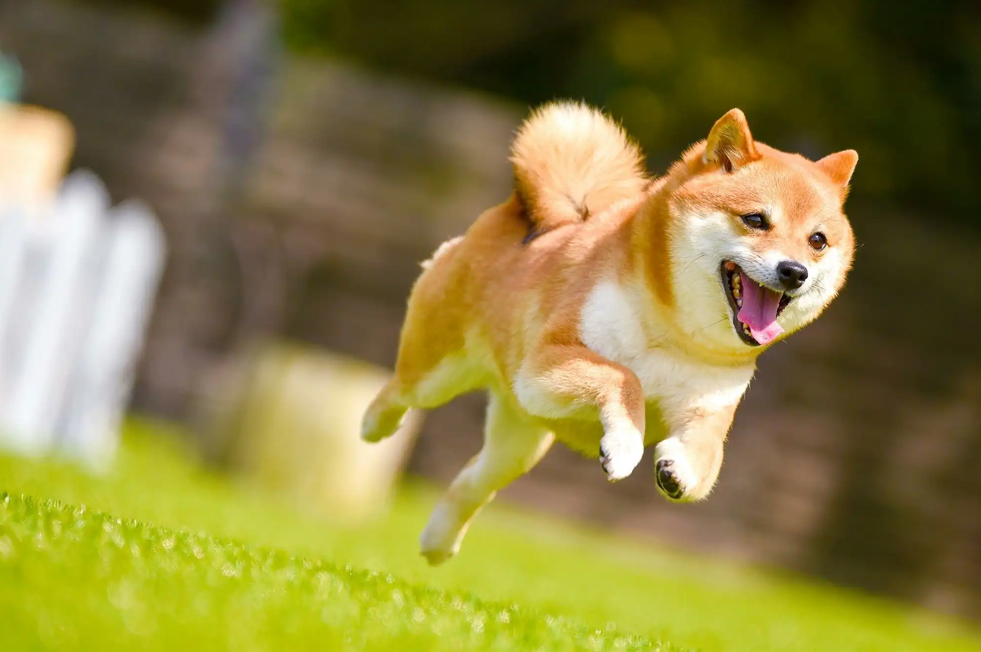
source: https://cooljapan-videos.com/tw/articles/epe0y86g

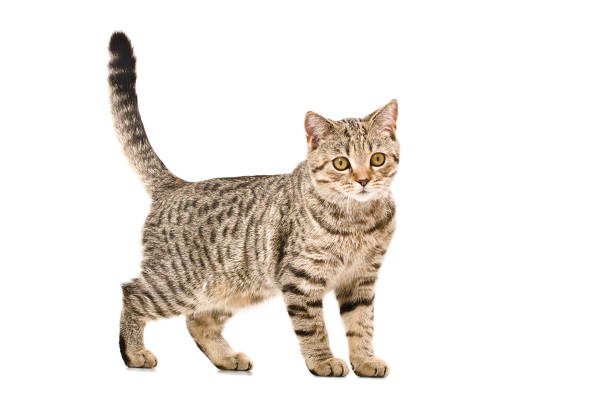
source: https://www.istockphoto.com/photo/young-cat-scottish-straight-gm1098182434-294927481

We will use the **llava-phi3** model that we installed to request a description of the images:

In [67]:
import ollama
response2 = ollama.chat(model='llava-phi3', messages=[
    {
        'role': 'user',
        'content': 'What is this image about?',
        'images': ['./pics/example1.png'] #Image with the dog
    },
])

display(Markdown(response2['message']['content']))

In the heart of a verdant field, a Shiba Inu dog is captured in mid-air, its body tilted forward and legs spread out in an impressive display of agility. The dog's coat, a striking contrast against the greenery, mirrors the colors of a pile of leaves that are scattered haphazardly across the field. The Shiba Inu's tail stands up high, adding to its lively demeanor as it looks directly into the camera with an expression of pure joy and excitement. The background is blurred, drawing focus to the dog and enhancing the sense of motion in this delightful snapshot of a moment frozen in time.

In [68]:
response3 = ollama.chat(model='llava-phi3', messages=[
    {
        'role': 'user',
        'content': 'What is this image about?',
        'images': ['./pics/example2.jpg'] #Image with the cat
    },
])

display(Markdown(response3['message']['content']))

The image features a tabby cat with a white chest and paws. The cat is standing on all fours, its body angled slightly to the right. Its tail is raised in a playful manner, adding to the overall alertness of the cat's demeanor. The head of the cat is turned towards the camera, giving us a clear view of its yellow eyes and ears adorned with black stripes. The background of the image is plain white, which contrasts with the cat's darker fur color and allows it to stand out prominently in the frame. There are no other objects or text present in the image.


### ** >>> Exercise 10 (Take home): **  

Try asking the model with one image of your choosing. Is the description accurate? Why?

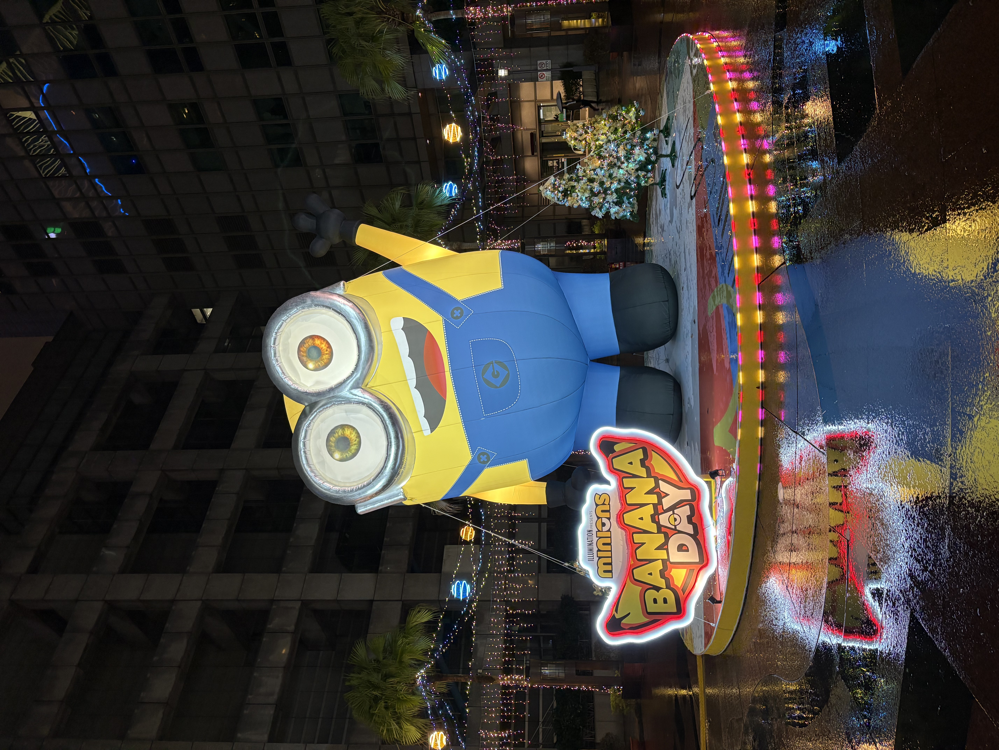


In [103]:
import ollama
from IPython.display import display, Markdown

# 使用您選擇的圖片
response = ollama.chat(
    model='llava-phi3',  # 確保這裡的模型名稱正確
    messages=[
        {
            'role': 'user',
            'content': 'Can you describe this image for me?',
            'images': [r"C:\Users\thoma\OneDrive\圖片\A5711567-94EC-4BAE-8441-CCF06BADC537.jpg"]  # 替換為您圖片的路徑
        },
    ]
)

# 顯示描述結果
display(Markdown(response['message']['content']))


In the center of a city street, a whimsical scene unfolds. A large cardboard cutout of a minion from the movie "Despicable Me" stands proudly on its side, as if guarding the area. Its blue body and yellow face are vivid against the muted colors of the surroundings.

Just below the minion, two neon signs add a splash of color to the scene. One sign features a red word "STREET", while another displays "DANCE" in white letters on a green background. These signs seem to invite passersby to join in the fun and dance down the street.

The backdrop to this lively tableau is a cityscape, with buildings stretching upwards into the distance and trees adding touches of nature amidst the urban environment. The relative positions of these elements create a layered effect, with the minion cutout in the foreground, followed by the neon signs, then the cityscape, and finally the sky at the topmost level.

This image captures a moment of joy and creativity in an everyday urban setting, reminding us that fun can be found in unexpected places.

### 10.3 Retrieval-Augmented Generation (RAG)
RAG (Retrieval-Augmented Generation) is a technique where a language model combines document retrieval with text generation. In RAG, a retrieval system first finds relevant documents or text chunks, and then the language model uses this retrieved information to generate a more informed and accurate response. This method enhances the model's ability to answer questions by grounding its responses in real, external data.

In the following code, we will load a webpage as a document, which allows us to retrieve text from a URL. After loading the content, we will split the document into smaller, manageable chunks, making it easier for our model to process. Then, we'll generate embeddings for these chunks with a specified LLM model (e.g., Llama3.2). These embeddings will be stored in a vector database, which enables us to perform similarity searches. By setting up this retrieval system, we can use a RAG chain to answer questions. The retriever finds relevant text chunks from the document based on a query, and the LLM generates a response by incorporating this retrieved information, making the answers more grounded and accurate.

In [104]:
import ollama
import bs4
from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain_community.document_loaders import WebBaseLoader
from langchain_community.vectorstores import FAISS
from langchain_community.embeddings import OllamaEmbeddings
from langchain_core.output_parsers import StrOutputParser
from langchain_core.runnables import RunnablePassthrough

llm_model = "llama3.2" #You can change to the one of your preference

# Function to load, split, and retrieve documents
def load_and_retrieve_docs(url):
    loader = WebBaseLoader(
        web_paths=(url,),
        bs_kwargs=dict() 
    ) 
    docs = loader.load() #We will load the URL that will serve as our data source
    text_splitter = RecursiveCharacterTextSplitter(chunk_size=1000, chunk_overlap=200) #We will divide the URL in chunks of text for easier comparison in the vector space
    splits = text_splitter.split_documents(docs)
    #print(splits) #You can print this to see how the chunks in the url where split
    embeddings = OllamaEmbeddings(model=llm_model) #Generating embeddings with our chosen model
    vectorstore = FAISS.from_documents(documents=splits, embedding=embeddings) #Our vector space for comparison
    return vectorstore.as_retriever()

url="https://www.ibm.com/topics/large-language-models"
# Create the retriever
retriever = load_and_retrieve_docs(url)

def format_docs(docs):
    return "\n\n".join(doc.page_content for doc in docs) #Format the retrieved docs in an orderly manner for prompting

# Define the Ollama LLM function
def ollama_llm(question, context):
    formatted_prompt = f"Question: {question}\n\nContext: {context}"
    response = ollama.chat(model='llama3.2', messages=[{'role': 'user', 'content': formatted_prompt}])
    return response['message']['content']

# Define the RAG chain
def rag_chain(question):
    retrieved_docs = retriever.invoke(question)
    formatted_context = format_docs(retrieved_docs)
    return ollama_llm(question, formatted_context)

# Use the RAG chain
result = rag_chain("What are the related solutions of IBM with LLMs?")
display(Markdown(result))

IBM's related solutions with LLMs include:

1. Watsonx.ai: A platform for building AI models using Granite models, which serve as the generative AI backbone for other IBM products like watsonx Assistant and watsonx Orchestrate.
2. Watsonx Assistant: A conversational AI service that leverages the power of LLMs to provide human-like interactions with customers and users.
3. Watsonx Orchestrate: An AI orchestration platform that enables organizations to automate and integrate various AI models, including those built on Granite models.
4. Open API integrations: IBM's solutions are designed to be easily accessible through APIs, allowing developers and organizations to harness the capabilities of LLMs without requiring extensive technical expertise.

These solutions demonstrate how IBM is leveraging LLMs to drive business value and improve customer experiences across various industries.


### **Actual content in the URL:**
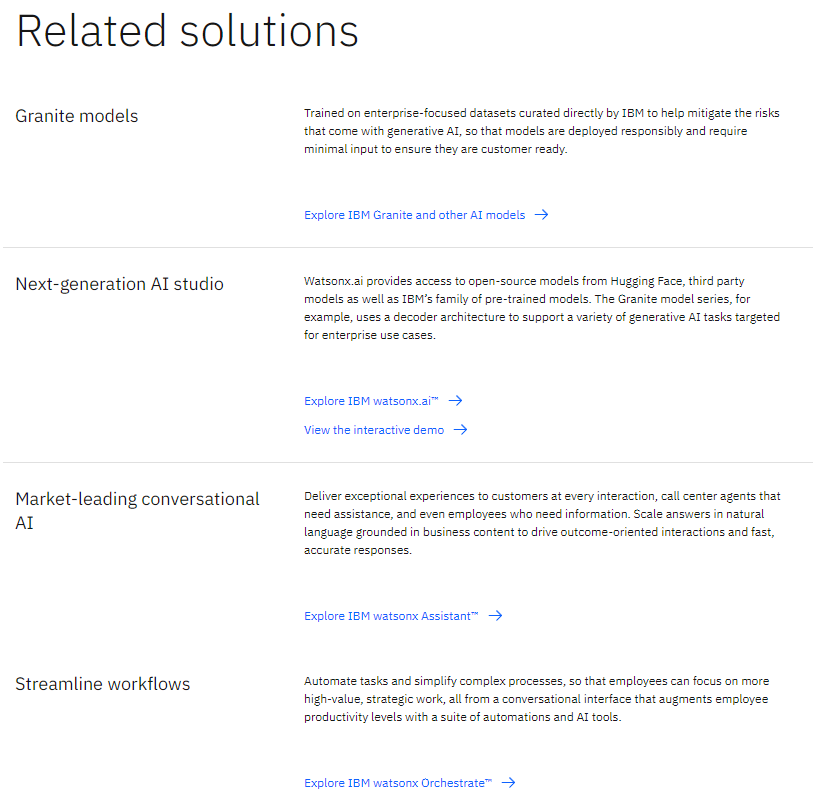

source: https://www.ibm.com/topics/large-language-models



### ** >>> Exercise 11 (Take home): **  

Try to modify the code to make it accept **three URLs**, or **three text documents** of your choosing. After modifying it, make **three prompts/questions** with information that can be found in each of the documents/urls, **compare the accuracy of the response** with the actual answer. Investigate and discuss the advantages and disadvantages of RAG systems.

In [105]:
import ollama
import bs4
from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain_community.document_loaders import WebBaseLoader
from langchain_community.vectorstores import FAISS
from langchain_community.embeddings import OllamaEmbeddings
from langchain_core.output_parsers import StrOutputParser
from langchain_core.runnables import RunnablePassthrough

llm_model = "llama3.2"

# 載入、分割與檢索多個 URL 的文件
def load_and_retrieve_docs(urls):
    all_splits = []
    for url in urls:
        loader = WebBaseLoader(
            web_paths=(url,),
            bs_kwargs=dict()
        )
        docs = loader.load()
        text_splitter = RecursiveCharacterTextSplitter(chunk_size=1000, chunk_overlap=200)
        splits = text_splitter.split_documents(docs)
        all_splits.extend(splits)  # 將所有分割內容合併
    embeddings = OllamaEmbeddings(model=llm_model)
    vectorstore = FAISS.from_documents(documents=all_splits, embedding=embeddings)
    return vectorstore.as_retriever()

urls = [
    "https://www.ibm.com/topics/large-language-models",
    "https://hbr.org/2024/05/how-marketers-can-adapt-to-llm-powered-search",  # 用實際 URL 或文件替換
    "https://openai.com/index/whoop/"
]

# 建立檢索器
retriever = load_and_retrieve_docs(urls)

def format_docs(docs):
    return "\n\n".join(doc.page_content for doc in docs)

def ollama_llm(question, context):
    formatted_prompt = f"Question: {question}\n\nContext: {context}"
    response = ollama.chat(model=llm_model, messages=[{'role': 'user', 'content': formatted_prompt}])
    return response['message']['content']

def rag_chain(question):
    retrieved_docs = retriever.invoke(question)
    formatted_context = format_docs(retrieved_docs)
    return ollama_llm(question, formatted_context)

# 示例問題
questions = [
    "What are IBM's related solutions for LLMs?",
    "What are the primary benefits of using LLMs in the healthcare industry?",
    "How is data privacy ensured in large-scale data models?"
]

# 使用 RAG 鏈來回答每個問題
for question in questions:
    result = rag_chain(question)
    display(Markdown(result))



Based on the provided context, IBM's related solutions for LLMs include:

1. Granite model series: a generative AI backbone for other IBM products like watsonx Assistant and watsonx Orchestrate.
2. Watsonx.ai: provides an interface for using LLMs in various applications.
3. watsonx Assistant: uses the Granite model series to provide conversational AI capabilities.

These solutions are designed to leverage the power of LLMs to drive business value, improve customer experiences, and streamline processes across various industries, including healthcare and finance.

The primary benefits of using Large Language Models (LLMs) in the healthcare industry include:

1. **Improved text generation**: LLMs can generate coherent and contextually relevant text, such as clinical notes, patient summaries, and medication lists.
2. **Enhanced language understanding**: LLMs can understand natural language inputs, including ambiguous or nuanced queries, allowing for more accurate and efficient communication with patients.
3. **Efficient content creation**: LLMs can assist in generating large volumes of content, such as clinical reports, educational materials, and patient education resources.
4. **Personalized medicine**: By generating personalized text based on individual patient needs and preferences, LLMs can help improve patient engagement and outcomes.
5. **Language translation**: LLMs can translate medical texts, allowing healthcare professionals to communicate with patients who speak different languages.
6. **Question answering and FAQs**: LLMs can provide answers to frequently asked questions (FAQs) about medications, treatments, and conditions, reducing the burden on clinical staff.
7. **Creative writing assistance**: LLMs can assist in generating creative content, such as patient stories, educational materials, or marketing copy.
8. **Code generation assistance**: LLMs can assist in generating code for medical devices, wearables, or other healthcare-related applications.
9. **Data analysis and summarization**: LLMs can summarize large volumes of clinical data, providing insights into trends, patterns, and correlations.
10. **Cost savings**: By automating tasks, reducing the need for manual content creation, and improving efficiency, LLMs can help reduce costs associated with healthcare operations.

Overall, LLMs have the potential to revolutionize the way healthcare professionals interact with technology, access information, and generate text, leading to improved patient outcomes, reduced costs, and enhanced overall care.

Ensuring data privacy in large-scale data models is crucial to prevent unwanted liability, damage to reputation, and exposure to harmful content. To achieve this, several strategies can be employed:

1. **Data Anonymization**: Removing personal identifiable information (PII) from the training dataset to prevent re-identification of individuals.
2. **Data Masking**: Redacting sensitive data such as names, addresses, or financial information to protect individual and organizational interests.
3. **De-Identification**: Transforming data into a format that cannot be linked back to an individual or organization.
4. **Data Encryption**: Encrypting training data both in transit and at rest to prevent unauthorized access.
5. **Access Controls**: Implementing strict access controls, such as role-based access, to limit who can train, fine-tune, or use the model.
6. **Regular Audits**: Conducting regular audits to ensure that the model is not generating harmful or sensitive content.
7. **Human Oversight**: Implementing human oversight and review processes to detect and correct any biased or harmful output.
8. **Data Quality Controls**: Establishing data quality controls to prevent the ingestion of low-quality, biased, or malicious data during training.

Additionally, organizations can also consider using techniques such as:

1. **Adversarial Training**: Training models to recognize and resist adversarial attacks that aim to manipulate their output.
2. **Robustness Techniques**: Using robustness techniques, such as adversarial training and ensembling, to improve the model's resilience against data corruption or manipulation.
3. **Explainability Methods**: Implementing explainability methods to provide insights into the decision-making process of the model.

By employing these strategies and techniques, organizations can ensure that their large-scale data models are both accurate and private, minimizing the risk of unwanted liability and damage to reputation.

## **Advantages and Disadvantages of RAG Systems**
#### **Advantage:**


1. Scalability:

    The RAG system can handle large amounts of data from different data sources, making it ideal for answering complex questions that require information from multiple sources.

2. Relevance: 

    RAG systems can retrieve specific information for questions, making answers more focused and improving accuracy relative to traditional retrieval or generation methods.

3. Adaptability: 

    The RAG system can integrate various forms of data, such as web pages, static files or structured data, making it applicable to a wide range of fields.
    
#### **Disadvantage:**

1. Dependence on search quality: 

    The quality of the final answer depends on the retrieved documents. If the retrieval phase fails, responses may lack context or be inaccurate.

2. Heavy processing load: 

    Splitting, embedding, and searching large numbers of files increases the demand for computing resources, especially when dealing with multiple or complex files.

3. Context limitations: 

    Although the RAG system is powerful, it still has limitations in integrating details across files or providing deep context. Embedding and retrieval depth may affect the effectiveness of the overall integration.
<hr>

### 10.4 Generating LLM Embeddings:
LLM embeddings are dense vector representations of text generated by Large Language Models. These embeddings, like we have already seen in the lab, capture the semantic meaning and relationships between words, phrases, or even entire documents by mapping them into a high-dimensional space where similar pieces of text are placed closer together. What makes LLM embeddings special is that they are contextual and rich in meaning, meaning the same word can have different embeddings based on its surrounding context.

For example, the word **"bank"** would have different embeddings in the sentences **"I sat by the river bank"** and **"I deposited money in the bank."** This ability to understand and encode context enables LLM embeddings to outperform traditional techniques (like TF-IDF or one-hot encoding) by providing a deeper, more nuanced representation of language.

Additionally, LLM embeddings are pre-trained on vast amounts of data, allowing them to generalize well across different tasks (like classification, clustering, or similarity detection) without the need for extensive retraining. This makes them highly valuable in many natural language processing tasks today.

**Now let's generate some embeddings with llama 3.2 for our dataset:**

In [106]:
import pandas as pd
import ollama

# Let's copy our dataframes for training and testing
df_train = train_df
df_test = test_df
# Define a function to generate embeddings
def generate_embeddings(row,text_column_name='text'):
    embeddings = ollama.embeddings(
        model='llama3.2',
        prompt=row[text_column_name],
    )
    return embeddings["embedding"]

In [107]:
# We use the text column
column_name = 'text'

# Apply the function to the specified column and store the result in a new column 'embeddings'
df_train['embeddings'] = df_train.apply(lambda row: generate_embeddings(row, column_name), axis=1)

In [108]:
df_test['embeddings'] = df_test.apply(lambda row: generate_embeddings(row, column_name), axis=1)

In [109]:
df_train #We can see the new column with the embeddings 

,id,text,emotion,intensity,text_tokenized,embeddings
3028,40201,Isn't the whole 'it's been hijacked' argument ...,sadness,0.636,"[Is, n't, the, whole, 'it, 's, been, hijacked,...","[2.1772239208221436, 0.08416405320167542, 1.86..."
917,20060,"@Montel_Williams If this ban goes through, it ...",fear,0.845,"[@, Montel_Williams, If, this, ban, goes, thro...","[-0.05836036801338196, 1.9312160015106201, 1.2..."
3185,40358,#Terencecutcher #Tulsa the man onthe helicopte...,sadness,0.521,"[#, Terencecutcher, #, Tulsa, the, man, onthe,...","[-1.4441016912460327, 0.36074644327163696, 0.1..."
812,10812,@wesrucker247 sounds like a good game plan for...,anger,0.202,"[@, wesrucker247, sounds, like, a, good, game,...","[-1.0753495693206787, -1.0601766109466553, -1...."
2929,40102,Ill say it again. If I was a Black man Id be a...,sadness,0.729,"[Ill, say, it, again, ., If, I, was, a, Black,...","[0.556489884853363, 0.28211522102355957, 2.734..."
...,...,...,...,...,...,...
2114,30110,"Always be #cheerful, #smile often make others ...",joy,0.740,"[Always, be, #, cheerful, ,, #, smile, often, ...","[-1.8203901052474976, 0.5977420806884766, 1.47..."
2497,30493,@buzzlightbeard2 If you don't love yourself......,joy,0.438,"[@, buzzlightbeard2, If, you, do, n't, love, y...","[-2.635575532913208, -0.07209514081478119, 1.6..."
1320,20463,so I picked up my phone!!!' #shocking 😳,fear,0.542,"[so, I, picked, up, my, phone, !, !, !, ', #, ...","[0.28629037737846375, -0.46833735704421997, 0...."
1798,20941,#smackdev #ptp #start word,fear,0.312,"[#, smackdev, #, ptp, #, start, word]","[-1.3910260200500488, 0.21849924325942993, 6.4..."


In [110]:
df_test #We can see the new column with the embeddings 

,id,text,emotion,intensity,embeddings
68,10925,"Anger, resentment, and hatred are the destroye...",anger,0.375,"[-0.6393444538116455, -0.36064329743385315, -1..."
35,10892,@pbhushan1 @IndianExpress so in your opinion i...,anger,0.708,"[-0.7434884905815125, 1.812004566192627, 0.191..."
16,10873,"Is it me, or is Ding wearing the look of a man...",anger,0.500,"[-2.7333617210388184, 0.04854966700077057, 1.8..."
236,30865,"When we give cheerfully and accept gratefully,...",joy,0.712,"[-0.14626485109329224, 0.9659566879272461, 2.1..."
122,21185,On @Varneyco/@FoxBusiness to talk latest on #C...,fear,0.642,"[-1.7127000093460083, 0.9975252151489258, -0.5..."
...,...,...,...,...,...
194,30823,"@theclobra lol I thought maybe, couldn't decid...",joy,0.312,"[-1.1445326805114746, -0.04494772478938103, 2...."
6,10863,I think @Sam_Canaday &amp; @KYLEJDOWSON must a...,anger,0.250,"[-1.9468334913253784, 0.310100257396698, 3.607..."
272,30901,A hearty Jonza! to all my friends and follower.,joy,0.704,"[1.6080433130264282, 1.4512412548065186, -2.29..."
248,30877,@airtelindia have some issues with my broadban...,joy,0.340,"[0.09134252369403839, 2.4245715141296387, 2.48..."


Now let's train some models with these embeddings:

**KNeighborsClassifier (KNN)**: KNN is a simple, instance-based machine learning algorithm used for classification. It works by finding the 'k' nearest neighbors to a data point based on a distance metric (e.g., Euclidean distance) and assigning the most common class among those neighbors to the data point. KNN is non-parametric, meaning it doesn’t assume a specific form for the underlying data distribution, and it classifies points based on their similarity to other points in the training set. It's easy to understand and implement, though it can become computationally expensive with large datasets.

In [111]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

# Let's use the new Llama 3.2 embeddings as our training features and the emotions as our labels
X_train = df_train["embeddings"].tolist()
y_train = df_train['emotion']


# Initialize the KNN classifier
knn = KNeighborsClassifier(n_neighbors=10)

knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=10)

In [112]:
len(df_train["embeddings"][0]) # Llama 3.2 embedding dimension is 3072

3072

In [113]:
X_test = df_test["embeddings"].tolist()
y_test = df_test['emotion']

# Predicting the label for the test data
y_pred = knn.predict(X_test)

#Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)

print(f'KNN Accuracy: {accuracy}')

KNN Accuracy: 0.46397694524495675


In [114]:
## precision, recall, f1-score,
from sklearn.metrics import classification_report

print(classification_report(y_true=y_test, y_pred=y_pred))

              precision    recall  f1-score   support

       anger       0.41      0.46      0.44        84
        fear       0.53      0.54      0.53       110
         joy       0.43      0.42      0.43        79
     sadness       0.46      0.41      0.43        74

    accuracy                           0.46       347
   macro avg       0.46      0.46      0.46       347
weighted avg       0.47      0.46      0.46       347



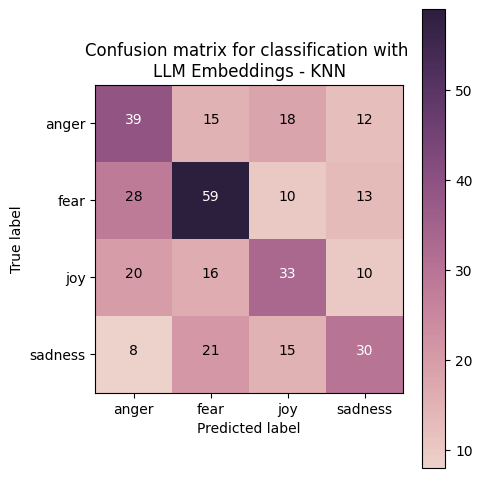

In [115]:
## check by confusion matrix
from sklearn.metrics import confusion_matrix

cm2 = confusion_matrix(y_true=y_test, y_pred=y_pred) 
my_tags = ['anger', 'fear', 'joy', 'sadness']
plot_confusion_matrix(cm2, classes=my_tags, title='Confusion matrix for classification with \nLLM Embeddings - KNN')

Now let's also try to apply our **Neural Network** to these embeddings:

In [116]:
X_llama_train = np.vstack(df_train["embeddings"].to_numpy()) #Defining our train set

In [117]:
X_llama_test = np.vstack(df_test["embeddings"].to_numpy()) #Defining our test set

In [118]:
X_llama_train.shape #(Number of data, Llama 3.2 embedding size)

(3613, 3072)

In [119]:
X_llama_test.shape #(Number of data, Llama 3.2 embedding size)

(347, 3072)

In [120]:
#One-hot encoding our labels
y_train_llama = label_encode(label_encoder, y_train)  
y_test_llama = label_encode(label_encoder, y_test)

In [121]:
# I/O check
input_shape_llama = len(X_llama_train[0])
print('input_shape: ', input_shape_llama)

output_shape = len(label_encoder.classes_)
print('output_shape: ', output_shape)

input_shape:  3072
output_shape:  4


In [122]:
#We try the same Neural Network Model Again
from keras.models import Model
from keras.layers import Input, Dense
from keras.layers import ReLU, Softmax

# input layer
model_input = Input(shape=(input_shape_llama, ))  # 3072
X = model_input

# 1st hidden layer
X_W1 = Dense(units=64)(X)  # 64
H1 = ReLU()(X_W1)

# 2nd hidden layer
H1_W2 = Dense(units=64)(H1)  # 64
H2 = ReLU()(H1_W2)

# output layer
H2_W3 = Dense(units=output_shape)(H2)  # 4
H3 = Softmax()(H2_W3)

model_output = H3

# create model
model = Model(inputs=[model_input], outputs=[model_output])

# loss function & optimizer
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# show model construction
model.summary() #We can notice that our parameter numbers went up because of the increase in the dimension of our input

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 3072)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 64)             │       196,672 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_4 (ReLU)                  │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_5 (ReLU)                  │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 4)              │           260 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ softmax_2 (Softmax)             │ (None, 4)              │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 201,092 (785.52 KB)

 Trainable params: 201,092 (785.52 KB)

 Non-trainable params: 0 (0.00 B)

In [123]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('logs/training_log_2.csv')

# training setting
epochs = 25
batch_size = 32

# training!
history = model.fit(X_llama_train, y_train_llama, 
                    epochs=epochs, 
                    batch_size=batch_size, 
                    callbacks=[csv_logger],
                    validation_data = (X_llama_test, y_test_llama))
print('training finish')

Epoch 1/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 12s 4ms/step - accuracy: 0.4007 - loss: 1.3559 - val_accuracy: 0.5447 - val_loss: 1.1083
Epoch 2/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6457 - loss: 0.8698 - val_accuracy: 0.5735 - val_loss: 1.0941
Epoch 3/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7580 - loss: 0.6435 - val_accuracy: 0.5793 - val_loss: 1.0973
Epoch 4/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7965 - loss: 0.5399 - val_accuracy: 0.5764 - val_loss: 1.1762
Epoch 5/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8380 - loss: 0.4587 - val_accuracy: 0.5389 - val_loss: 1.5368
Epoch 6/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8498 - loss: 0.3983 - val_accuracy: 0.5533 - val_loss: 1.3474
Epoch 7/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8934 - loss: 0.2939 - val_accuracy: 0.5274 - val_loss: 1.6737
Epoch 8/25
113/113 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9119 - loss: 0.2536 - val_accuracy: 0

In [124]:
## predict
pred_result = model.predict(X_llama_test, batch_size=128)
pred_result[:5]

1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/stepWARNING:tensorflow:6 out of the last 9 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x000001C57C3A5940> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


array([[9.63828385e-01, 1.69246923e-03, 5.61456615e-09, 3.44791338e-02],
       [3.56816541e-04, 9.95836616e-01, 3.88099870e-04, 3.41843814e-03],
       [6.72472954e-01, 2.22934650e-05, 4.20971730e-07, 3.27504367e-01],
       [6.02332413e-01, 2.78532654e-01, 1.09609544e-01, 9.52543877e-03],
       [1.10528235e-08, 9.99997616e-01, 2.74268542e-11, 2.39377300e-06]],
      dtype=float32)

In [125]:
pred_result = label_decode(label_encoder, pred_result)
pred_result[:5]

array(['anger', 'fear', 'anger', 'anger', 'fear'], dtype=object)

In [126]:
from sklearn.metrics import accuracy_score
#Accuracy
print('testing accuracy: {}'.format(round(accuracy_score(label_decode(label_encoder, y_test_llama), pred_result), 2)))

testing accuracy: 0.54


In [127]:
#Let's take a look at the training log
training_log = pd.DataFrame()
training_log = pd.read_csv("logs/training_log_2.csv")
training_log

,epoch,accuracy,loss,val_accuracy,val_loss
0,0,0.471353,1.205248,0.544669,1.108265
1,1,0.660947,0.848937,0.573487,1.094059
2,2,0.738445,0.676724,0.579251,1.097347
3,3,0.775533,0.585887,0.576369,1.176206
4,4,0.827844,0.463718,0.538905,1.536836
5,5,0.849709,0.400454,0.553314,1.347406
6,6,0.885414,0.318784,0.527378,1.673670
7,7,0.898422,0.284867,0.587896,1.576900
8,8,0.920565,0.227590,0.556196,1.755637
9,9,0.937171,0.187411,0.553314,1.952839


In [128]:
print(classification_report(y_true=label_decode(label_encoder, y_test_llama), y_pred=pred_result))

              precision    recall  f1-score   support

       anger       0.48      0.55      0.51        84
        fear       0.59      0.66      0.62       110
         joy       0.58      0.49      0.53        79
     sadness       0.48      0.39      0.43        74

    accuracy                           0.54       347
   macro avg       0.53      0.52      0.53       347
weighted avg       0.54      0.54      0.54       347



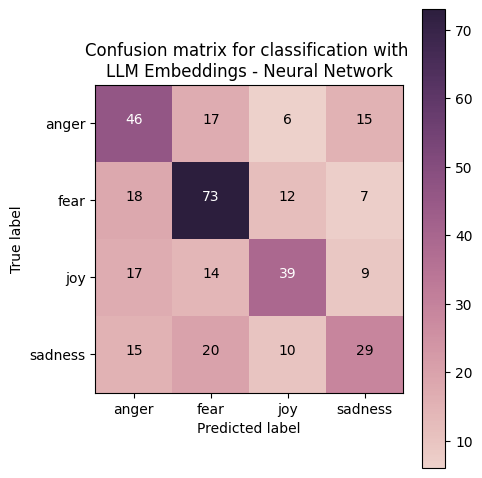

In [129]:
## check by confusion matrix
from sklearn.metrics import confusion_matrix

cm3 = confusion_matrix(y_true=label_decode(label_encoder, y_test_llama), y_pred=pred_result) 
my_tags = ['anger', 'fear', 'joy', 'sadness']
plot_confusion_matrix(cm3, classes=my_tags, title='Confusion matrix for classification with \nLLM Embeddings - Neural Network')

### ** >>> Exercise 12 (Take home): **

Follow Exercise 6 again and Plot the Training and Validation Accuracy and Loss for the results of this Neural Network. Compare the results of both KNN and the NN we just implemented. Discuss about why we obtained these results with the LLM Embeddings compared to the results of the other models implemented in this Lab.

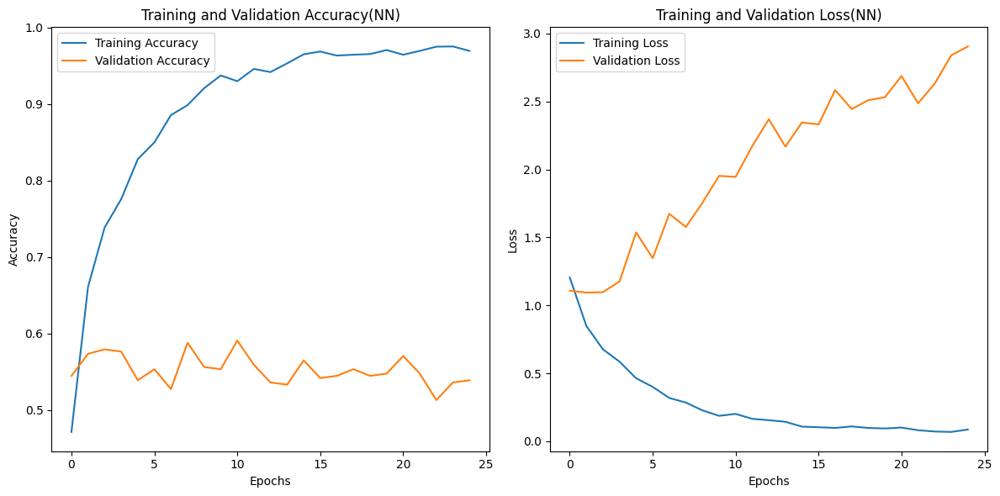

In [130]:
import matplotlib.pyplot as plt

# Plot Training and Validation Accuracy
plt.figure(figsize=(12, 6))

# Plot training accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy(NN)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plot training loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss(NN)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()



#### **KNN Results:**

The KNN model uses the Llama 3.2 embeddings as feature vectors and classifies based on the nearest neighbors in the feature space.

Its performance is dependent on the density of the data in the feature space, and it might suffer if there are outliers or if the data is sparse.

KNN models typically perform well on problems where the data is clustered and relatively simple. However, they might struggle when the relationships between features are more complex.

#### **Neural Network (NN) Results:**

The NN model we implemented uses fully connected layers, which allow it to learn more complex relationships between the Llama 3.2 embeddings and the labels (emotions).

By using activation functions like ReLU and Softmax in the output layer, the neural network is capable of learning non-linear patterns in the data.
Neural networks tend to outperform KNN when the data is high-dimensional (like Llama embeddings) because they can abstract and combine features in a more meaningful way.

**So from the above comparison of accuracy, classification_report and confusion matrix, we can see that the effect of using the NN model is better than the KNN model**

#### **Final Discussion:**

LLM embeddings (Llama 3.2) provide rich, high-dimensional representations of text that can significantly benefit neural networks. The embeddings capture semantic relationships, which the NN can leverage to improve classification accuracy.

KNN, on the other hand, doesn't capture these relationships explicitly. It may work decently with lower-dimensional or less complex data but may fall short when dealing with high-dimensional spaces where complex patterns exist.
<hr>

### 10.5 Few-Shot Prompting Classification:
Few-shot prompting classification for LLMs involves giving the model a few labeled examples (typically 5 or fewer) within a prompt to guide it in performing a classification task. Instead of needing extensive training, the LLM uses these examples to understand the task and classify new inputs. This approach is significant in current research because it allows LLMs to perform well on tasks with minimal labeled data, reducing the need for large training datasets and making it highly flexible for various NLP tasks, including those in low-resource languages or niche domains.

In this lab exercise, we will explore zero-shot, 1-shot, and 5-shot prompting for classification using an LLM:

- Zero-shot means the model performs classification without seeing any examples beforehand.
- 1-shot provides the model with just one labeled example per class to guide its classification.
- 5-shot gives the model five labeled examples per class to improve its understanding of the task.

Since processing large datasets can be computationally demanding, we will only sample 20 test texts per emotion for the classification task, allowing us to test the model's performance more efficiently without using the entire test set.

**Process order: Explanation Prompt -> Examples + labels (if it is not zero-shot) -> Text to classify**

**Recommendation for the explanation prompt:** Explain to the model that it is a classification model of certain labels, and to only output the label word, and no other explanation. In this case if the model does not follow the instructions we are retrying the same text until it outputs one of the accepted labels for it.

In [131]:
import ollama
import random
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, confusion_matrix

# Define the emotion labels
emotions = ['anger', 'fear', 'joy', 'sadness']
# Define the model to use for few-shot prompting
model_ollama = "llama3.2" 

# Function to sample examples per emotion category
def sample_few_shots(df, emotions, num_samples=5):
    few_shot_examples = {}
    for emotion in emotions:
        few_shot_examples[emotion] = df[df['emotion'] == emotion].sample(n=num_samples, random_state=42)
    return few_shot_examples

# Function to build the prompt based on the number of examples (few-shot, 1-shot, zero-shot)
def build_prompt(examples, emotions, num_shots=5):
    classification_instructions = """
You are an emotion classification model. You will be given a text from social media and your task is to classify the text into one of the following emotion categories: anger, fear, joy, or sadness.
You must only output one of these four labels. Do not provide any additional information or explanation. Just output the emotion label as one word.
    """
    
    prompt = classification_instructions + "\n\n"
    
    if num_shots > 0:
        prompt += f"Examples: \n"
        for emotion in emotions:
            for _, row in examples[emotion].iterrows():
                prompt += f"Text: {row['text']}\nEmotion: {emotion}\n\n" #Show the examples in the same format it will be shown for the classification text
                if num_shots == 1:  # If 1-shot, break after the first example for each emotion
                    break
    return prompt

# Function to classify using the LLM with retry for incorrect responses
def classify_with_llm(test_text, prompt_base):
    valid_emotions = ['anger', 'fear', 'joy', 'sadness']
    response = None
    while not response or response not in valid_emotions:
        full_prompt = f"{prompt_base}\nClassification:\nText: {test_text}\nEmotion: " #The classification text will leave the emotion label to be filled in by the LLM
        result = ollama.chat(model=model_ollama, messages=[
            {'role': 'user', 'content': full_prompt}
        ])
        response = result['message']['content'].strip().lower()  # Clean and standardize the response
        if response not in valid_emotions:  # Retry if not a valid response
            print(f"Invalid response: {response}. Asking for reclassification.")
    return response

# Main function to run the experiment with the option for zero-shot, 1-shot, or 5-shot prompting
def run_experiment(df_train, df_test, test_samples=5, num_shots=5):
    # Sample examples for few-shot prompting based on num_shots
    if num_shots > 0:
        few_shot_examples = sample_few_shots(df_train, emotions, num_samples=num_shots) 
        prompt_base = build_prompt(few_shot_examples, emotions, num_shots=num_shots)
    else:
        prompt_base = build_prompt(None, emotions, num_shots=0)  # Zero-shot has no examples

    # Prepare to classify the test set
    predictions = []
    true_labels = []
    print(prompt_base)
    # Sample 20 examples per emotion for the test set to classify
    test_samples = sample_few_shots(df_test, emotions, num_samples=test_samples)

    # Classify 20 test examples (5 from each category) and save predictions
    for emotion in emotions:
        for _, test_row in test_samples[emotion].iterrows():
            test_text = test_row['text']
            predicted_emotion = classify_with_llm(test_text, prompt_base)
            predictions.append(predicted_emotion)
            true_labels.append(emotion)

    # Calculate accuracy
    accuracy = accuracy_score(true_labels, predictions)
    print(f"Accuracy: {accuracy * 100:.2f}%")
    
    # Classification report
    print(classification_report(y_true=true_labels, y_pred=predictions))
    
    # Plot confusion matrix
    cm = confusion_matrix(y_true=true_labels, y_pred=predictions) 
    my_tags = ['anger', 'fear', 'joy', 'sadness']
    plot_confusion_matrix(cm, classes=my_tags, title=f'Confusion matrix for classification with \n{num_shots}-shot prompting')


You are an emotion classification model. You will be given a text from social media and your task is to classify the text into one of the following emotion categories: anger, fear, joy, or sadness.
You must only output one of these four labels. Do not provide any additional information or explanation. Just output the emotion label as one word.
    


Invalid response: none. Asking for reclassification.
Invalid response: none. Asking for reclassification.
Invalid response: none. Asking for reclassification.
Invalid response: none. Asking for reclassification.
Accuracy: 45.00%
              precision    recall  f1-score   support

       anger       0.37      0.50      0.43        20
        fear       1.00      0.05      0.10        20
         joy       0.44      0.85      0.58        20
     sadness       0.62      0.40      0.48        20

    accuracy                           0.45        80
   macro avg       0.61      0.45      0.40        80
weighted avg       0.61      0.45    

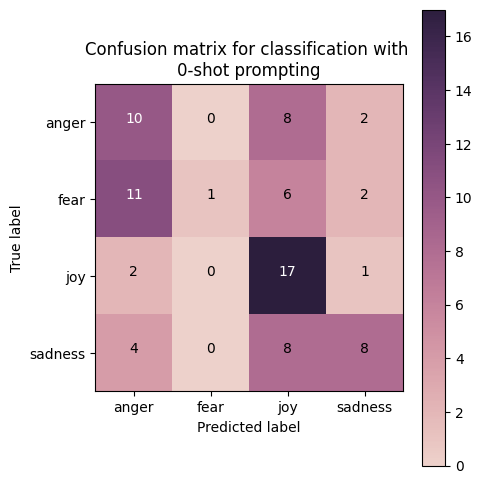

In [132]:
# Example of running the experiment with zero-shot prompting
run_experiment(df_train, df_test, test_samples=20, num_shots=0)


You are an emotion classification model. You will be given a text from social media and your task is to classify the text into one of the following emotion categories: anger, fear, joy, or sadness.
You must only output one of these four labels. Do not provide any additional information or explanation. Just output the emotion label as one word.
    

Examples: 
Text: @RonMexico760 The guy who calls people 'cuck' and is anti-BLM is offended by idea that he might not be pro-policing reform? That's amazing.
Emotion: anger

Text: #panic Panic attack from fear of starting new medication
Emotion: fear

Text: Accept the challenges so that you can feel the exhilaration of victory. #FocusX10 #motivation #motivationalquotes #quoteoftheday
Emotion: joy

Text: @GriffinLaneP @Mediaite The Left has been protected so long, they've lost their reasoning power.
Emotion: sadness




Accuracy: 42.50%
              precision    recall  f1-score   support

       anger       0.34      0.70      0.46        20
        fear       1.00      0.05      0.10        20
         joy       0.45      0.75      0.57        20
     sadness       0.80      0.20      0.32        20

    accuracy                           0.42        80
   macro avg       0.65      0.42      0.36        80
weighted avg       0.65      0.42      0.36        80



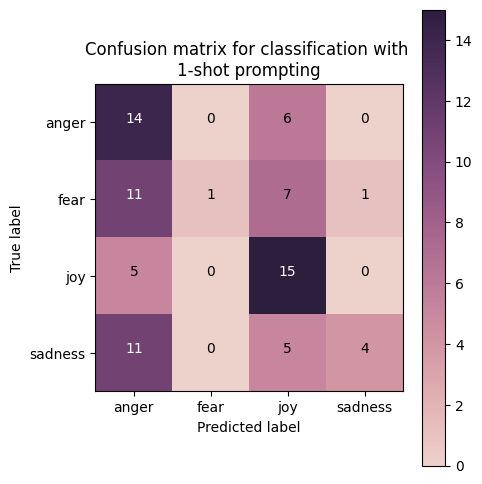

In [133]:
# Example of running the experiment with 1-shot prompting
run_experiment(df_train, df_test, test_samples=20, num_shots=1)


You are an emotion classification model. You will be given a text from social media and your task is to classify the text into one of the following emotion categories: anger, fear, joy, or sadness.
You must only output one of these four labels. Do not provide any additional information or explanation. Just output the emotion label as one word.
    

Examples: 
Text: @RonMexico760 The guy who calls people 'cuck' and is anti-BLM is offended by idea that he might not be pro-policing reform? That's amazing.
Emotion: anger

Text: If I spend more than £10 in shimmy on £1 drinks I'll be raging, but we all know it's gonna happen
Emotion: anger

Text: OOOOOOOOH MY GOD UUUUGGGGHHHHHHHHH 
Emotion: anger

Text: @Daniel_Sankey @hayleyp79 Haha.... Actually, after the Doggies I'm barracking for Anyone But GWS! #bitter
Emotion: anger

Text: ESPN just assumed I wanted their free magazines 
Emotion: anger

Text: #panic Panic attack from fear of starting new medication
Emotion: fear

Text: im tired of p

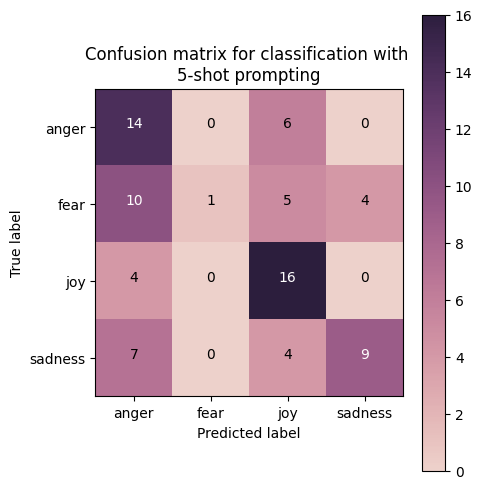

In [134]:
# Example of running the experiment with 5-shot prompting
run_experiment(df_train, df_test, test_samples=20, num_shots=5)

### ** >>> Exercise 13 (Take home): **

Compare and discuss the results of the zero-shot, 1-shot and 5-shot classification.

1. Zero-shot learning shows bad performance due to the lack of any contextual examples to guide the model. It relies heavily on prior knowledge embedded in the model, which is limiting in the case of sentiment classification.

2. One-shot learning resulted in slightly improvements in some classification, especially for anger, showing that even just one example of each emotion can provide useful context. However, the model still struggles with certain emotions, such as fear, and its precision and recall remain poor.

3. The accuracy of 5-shot learning is the highest, but overall it is still not very high. While anger and fear can benefit significantly, sadness and joy still pose challenges. The model now has more contextual information, which helps better understand sentiment, but it still has trouble generalizing to unseen data.
<hr>

### 10.6 Extra LLM Materials:
So this will be it for the lab, but here are some extra materials if you would like to explore:
- How to use Gemini's LLM API from Google: [Gemini Collab](https://colab.research.google.com/github/google/generative-ai-docs/blob/main/site/en/gemini-api/docs/get-started/python.ipynb?fbclid=IwZXh0bgNhZW0CMTEAAR0-gg7cDIuaGfkeN5U3rusSNKj2jj7bIsL45sZWaM0NbTE7BSNtfzBeEGE_aem_yT5wAuL_G5E21iuuCYJXwA#scrollTo=hskqSKnJUHvp) (Free with some restrictions to the requests per minute.

- How to use OpenAI ChatGPT model's API (Not Free API): [Basics Video](https://www.youtube.com/watch?v=e9P7FLi5Zy8), [Basics GitHub](https://github.com/gkamradt/langchain-tutorials/blob/main/chatapi/ChatAPI%20%2B%20LangChain%20Basics.ipynb), [RAG's Basics Video](https://www.youtube.com/watch?v=9AXP7tCI9PI&t=300s), [RAG's Basics GitHub](https://github.com/techleadhd/chatgpt-retrieval)

- **Advanced topic - QLoRA (Quantized Low-Rank Adapter):** QLoRA is a method used to make fine-tuning large language models more efficient. It works by adding a small, trainable part (LoRA) to a pre-trained model, while keeping the rest of the model frozen. At the same time, it reduces the size of the model’s data using a process called quantization, which makes the model require less memory. This allows you to fine-tune large models without needing as much computational power, making it easier to adapt models for specific tasks. Materials: [Paper GitHub](https://github.com/artidoro/qlora?tab=readme-ov-file), [Llama 3 Application Video](https://www.youtube.com/watch?v=YJNbgusTSF0&t=512s),[Llama 3 Application GitHub](https://github.com/adidror005/youtube-videos/blob/main/LLAMA_3_Fine_Tuning_for_Sequence_Classification_Actual_Video.ipynb)

---